# Setup

In [ ]:
import os, sys

In [ ]:
pip install ultralytics >/dev/null

In [ ]:
import numpy as np
import pandas as pd
import time
from tqdm import tqdm
import plotly.graph_objects as go
import torch
import cv2
from ultralytics import YOLO
from sklearn.model_selection import train_test_split
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score, classification_report
from tensorflow.keras.preprocessing.image import load_img, img_to_array
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import seaborn as sns
import re
import tifffile as tiff

In [ ]:
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, TensorDataset, random_split
from torchvision import models, transforms
from PIL import Image
import seaborn as sns
from sklearn.metrics import confusion_matrix

In [ ]:
pwd

'/content/drive/MyDrive/16873/classification'

In [ ]:
cd /content/drive/MyDrive/16873/classification

/content/drive/MyDrive/16873/classification


# Augmentation

Earth Pose:
 [[          1           0           0           0]
 [          0           1           0           0]
 [          0           0           1           0]
 [          0           0           0           1]]

Satellite Pose:
 [[          1           0           0           0]
 [          0           1           0           0]
 [          0           0           1           0]
 [          0           0           0           1]]

Homography Matrix:
 [[     1.2667         0.6     -83.333]
 [   -0.33333           1      66.667]
 [          0           0           1]]

Warped Satellite Pose:
 [[     1.2667         0.6           0     -83.333]
 [   -0.33333           1           0      66.667]
 [          0           0           1           0]
 [          0           0           0           1]]


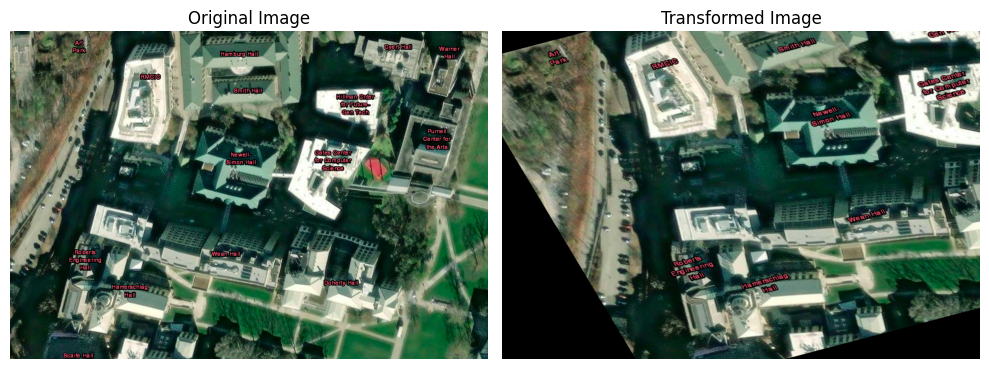

In [ ]:
# Assume a simple initial satellite pose matrix (identity matrix)
initial_satellite_pose = np.eye(4)

# Load the image
image = cv2.imread('earth.png')

# Define the points for the affine transformation
pts1 = np.float32([[50,50],[200,50],[50,200]])
pts2 = np.float32([[10,100],[200,50],[100,250]])

# Compute the affine transformation matrix
affine_matrix = cv2.getAffineTransform(pts1, pts2)

# Apply the affine transformation to the image
augmented_image = cv2.warpAffine(image, affine_matrix, (image.shape[1], image.shape[0]))

# Extend the affine transformation matrix to a homography matrix (3x3)
homography_matrix = np.eye(3)
homography_matrix[:2, :] = affine_matrix

def update_satellite_pose(initial_satellite_pose, homography_matrix):
    # Decompose the homography matrix
    rotation_matrix = homography_matrix[:2, :2]
    translation_vector = homography_matrix[:2, 2]

    # Extend to a 3x3 rotation matrix (assuming no rotation around the z-axis)
    extended_rotation = np.eye(3)
    extended_rotation[:2, :2] = rotation_matrix

    # Extend the translation vector to 3D (assuming no translation along the z-axis)
    extended_translation = np.array([translation_vector[0], translation_vector[1], 0])

    # Update the initial satellite pose
    new_satellite_pose = np.copy(initial_satellite_pose)
    new_satellite_pose[:3,:3] = np.dot(initial_satellite_pose[:3,:3], extended_rotation)
    new_satellite_pose[:3,3] = initial_satellite_pose[:3,3] + extended_translation

    return new_satellite_pose

# Update the satellite pose based on the affine transformation
new_satellite_pose = update_satellite_pose(initial_satellite_pose, homography_matrix)

# Print the satellite pose before and after the transformation
print("Earth Pose:\n", np.eye(4))  # Identity matrix, assuming the Earth is at the origin with no rotation
print("\nSatellite Pose:\n", initial_satellite_pose)
print("\nHomography Matrix:\n", homography_matrix)
print("\nWarped Satellite Pose:\n", new_satellite_pose)

def add_camera_pose(fig, pose, name):
    origin = pose[:3, 3]
    orientation = pose[:3, :3]
    # Scale the orientation for better visualization
    orientation *= 50
    # Draw the coordinate axes
    for i, color in zip(range(3), ['red', 'green', 'blue']):
        fig.add_trace(go.Scatter3d(
            x=[origin[0], origin[0] + orientation[0, i]],
            y=[origin[1], origin[1] + orientation[1, i]],
            z=[origin[2], origin[2] + orientation[2, i]],
            mode='lines',
            name=f'{name} {["X", "Y", "Z"][i]}-axis',
            line=dict(color=color)
        ))

def add_center(fig, center, name):
    fig.add_trace(go.Scatter3d(
        x=[center[0]],
        y=[center[1]],
        z=[center[2]],  # Update to reflect the z-coordinate
        mode='markers',
        marker=dict(size=10),
        name=f'{name} Image Center'
    ))

# Calculate the center of the image
image_center = np.array([image.shape[1]/2, image.shape[0]/2, 1])

# Extend to 3D (assuming the image center lies along the z-axis)
image_center_3d = np.array([0, 0, image_center[0]])  # Using x-coordinate as z-value for simplicity

# Create the figure
fig = go.Figure()

add_camera_pose(fig, initial_satellite_pose, 'Original Pose')
add_camera_pose(fig, new_satellite_pose, 'Transformed Pose')
add_center(fig, image_center_3d, 'Original')
# Assuming the transformed image center still lies along the z-axis
add_center(fig, image_center_3d, 'Transformed')

# Update layout for better visualization
fig.update_layout(
    scene=dict(
        xaxis_title='X',
        yaxis_title='Y',
        zaxis_title='Z',
        aspectmode='cube'
    ),
    margin=dict(l=0, r=0, b=0, t=0)
)

# Create a new figure using matplotlib to display images
plt.figure(figsize=(10, 5))

# Display the original and transformed images
plt.subplot(1, 2, 1)
plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
plt.title('Original Image')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(cv2.cvtColor(augmented_image, cv2.COLOR_BGR2RGB))
plt.title('Transformed Image')
plt.axis('off')

plt.tight_layout()
plt.show()

# Display the camera poses using plotly
fig.show()


# YOLO Benchmark

In [ ]:
# Load a model
model = YOLO("yolov8n.yaml")  # build a new model from scratch
model = YOLO("yolov8n.pt")  # load a pretrained model (recommended for training)


                   from  n    params  module                                       arguments                     
  0                  -1  1       464  ultralytics.nn.modules.conv.Conv             [3, 16, 3, 2]                 
  1                  -1  1      4672  ultralytics.nn.modules.conv.Conv             [16, 32, 3, 2]                
  2                  -1  1      7360  ultralytics.nn.modules.block.C2f             [32, 32, 1, True]             
  3                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  4                  -1  2     49664  ultralytics.nn.modules.block.C2f             [64, 64, 2, True]             
  5                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  6                  -1  2    197632  ultralytics.nn.modules.block.C2f             [128, 128, 2, True]           
  7                  -1  1    295424  ultralytics.nn.modules.conv.Conv             [128

In [ ]:
!wget https://ultralytics.com/images/bus.jpg

--2023-10-09 15:18:15--  https://ultralytics.com/images/bus.jpg
Resolving ultralytics.com (ultralytics.com)... 99.83.190.102, 75.2.70.75
Connecting to ultralytics.com (ultralytics.com)|99.83.190.102|:443... connected.
HTTP request sent, awaiting response... 301 Moved Permanently
Location: https://www.ultralytics.com/images/bus.jpg [following]
--2023-10-09 15:18:15--  https://www.ultralytics.com/images/bus.jpg
Resolving www.ultralytics.com (www.ultralytics.com)... 3.233.126.24, 34.234.52.18, 52.206.163.162
Connecting to www.ultralytics.com (www.ultralytics.com)|3.233.126.24|:443... connected.
HTTP request sent, awaiting response... 301 Moved Permanently
Location: https://raw.githubusercontent.com/ultralytics/yolov5/master/data/images/bus.jpg [following]
--2023-10-09 15:18:16--  https://raw.githubusercontent.com/ultralytics/yolov5/master/data/images/bus.jpg
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.110.133, 185.199.108.133, 185.199.111.133, ...
Connecting

In [ ]:
# Load the model
mds = ['m','n','s','l','x']
# model = YOLO("yolov8n.pt")  # Load a pretrained model

# Load the image
image_path = 'bus.jpg'
original_image = cv2.imread(image_path)
original_image = cv2.cvtColor(original_image, cv2.COLOR_BGR2RGB)  # Convert to RGB

# Benchmark settings
batch_sizes = [1, 2, 4, 8, 16]  # Adjust as needed
image_sizes = [320, 640, 1280]  # Adjust as needed

# Storage for results
model_size_values = []
batch_size_values = []
image_size_values = []
throughput_values = []

# Benchmarking
for mod in mds:
    model = YOLO("yolov8{}.pt".format(mod))
    for batch_size in batch_sizes:
        for image_size in image_sizes:
            # Resize the image
            resized_image = cv2.resize(original_image, (image_size, image_size))
            images = torch.tensor(resized_image).permute(2, 0, 1).unsqueeze(0).float() / 255.0  # Normalize
            images = images.repeat(batch_size, 1, 1, 1)  # Create a batch

            # Warm up
            for _ in range(5):
                with torch.no_grad():
                    _ = model(images)

            # Benchmark
            start_time = time.time()
            with torch.no_grad():
                for _ in range(10):  # Adjust as needed
                    _ = model(images)
            elapsed_time = time.time() - start_time

            # Calculate throughput
            throughput = (10 * batch_size) / elapsed_time  # 10 iterations

            # Store results
            model_size_values.append(mod)
            batch_size_values.append(batch_size)
            image_size_values.append(image_size)
            throughput_values.append(throughput)


0: 1280x1280 4 persons, 1 bicycle, 2 buss, 1: 1280x1280 4 persons, 1 bicycle, 2 buss, 2: 1280x1280 4 persons, 1 bicycle, 2 buss, 3: 1280x1280 4 persons, 1 bicycle, 2 buss, 4: 1280x1280 4 persons, 1 bicycle, 2 buss, 5: 1280x1280 4 persons, 1 bicycle, 2 buss, 6: 1280x1280 4 persons, 1 bicycle, 2 buss, 7: 1280x1280 4 persons, 1 bicycle, 2 buss, 8: 1280x1280 4 persons, 1 bicycle, 2 buss, 9: 1280x1280 4 persons, 1 bicycle, 2 buss, 10: 1280x1280 4 persons, 1 bicycle, 2 buss, 11: 1280x1280 4 persons, 1 bicycle, 2 buss, 12: 1280x1280 4 persons, 1 bicycle, 2 buss, 13: 1280x1280 4 persons, 1 bicycle, 2 buss, 14: 1280x1280 4 persons, 1 bicycle, 2 buss, 15: 1280x1280 4 persons, 1 bicycle, 2 buss, 1989.4ms
Speed: 4.8ms preprocess, 124.3ms inference, 57.9ms postprocess per image at shape (1, 3, 1280, 1280)

0: 1280x1280 4 persons, 1 bicycle, 2 buss, 1: 1280x1280 4 persons, 1 bicycle, 2 buss, 2: 1280x1280 4 persons, 1 bicycle, 2 buss, 3: 1280x1280 4 persons, 1 bicycle, 2 buss, 4: 1280x1280 4 persons,

In [ ]:
# Organize the data for easier plotting
data_dict = {}
for ms, bs, is_, tp in zip(model_size_values, batch_size_values, image_size_values, throughput_values):
    key = (ms, bs)
    if key not in data_dict:
        data_dict[key] = {'x': [], 'y': [], 'z': []}
    data_dict[key]['x'].append(is_)  # image size on x-axis
    data_dict[key]['y'].append(ms)   # model size on y-axis
    data_dict[key]['z'].append(tp)   # throughput on z-axis

# Create the figure
fig = go.Figure()

# Add a line for each combination of model size and batch size
for key, data in data_dict.items():
    fig.add_trace(go.Scatter3d(
        x=data['x'],
        y=data['y'],
        z=data['z'],
        mode='lines+markers',
        name=f'Model Size {key[0]}, Batch Size {key[1]}'
    ))

# Set labels and title
fig.update_layout(
    scene=dict(
        xaxis_title='Image Size',
        yaxis_title='Model Size (m:1, n:2, s:3, l:4, x:5)',
        zaxis_title='Throughput (images/second)',
    ),
    title="YOLOv8 Throughput Benchmark",
)

# Show the chart
fig.show()

# Region Data Processing

In [ ]:
# !unzip landsat_ot_c2_l1_data.zip

Archive:  landsat_ot_c2_l1_data.zip
   creating: landsat_ot_c2_l1_data/15_26/
  inflating: landsat_ot_c2_l1_data/15_26/LC08_L1TP_015026_20230807_20230812_02_T1.jpg  
  inflating: landsat_ot_c2_l1_data/15_26/LC08_L1TP_015026_20230807_20230812_02_T1_MTL.txt  
   creating: landsat_ot_c2_l1_data/15_31/
  inflating: landsat_ot_c2_l1_data/15_31/LC08_L1TP_015031_20230908_20230912_02_T1.jpg  
  inflating: landsat_ot_c2_l1_data/15_31/LC08_L1TP_020031_20230911_20230918_02_T1_MTL.txt  
   creating: landsat_ot_c2_l1_data/20_26/
  inflating: landsat_ot_c2_l1_data/20_26/LC08_L1TP_020026_20230911_20230918_02_T1.jpg  
  inflating: landsat_ot_c2_l1_data/20_26/LC08_L1TP_020026_20230911_20230918_02_T1_MTL.txt  
   creating: landsat_ot_c2_l1_data/20_31/
  inflating: landsat_ot_c2_l1_data/20_31/LC08_L1TP_020031_20230911_20230918_02_T1.jpg  
  inflating: landsat_ot_c2_l1_data/20_31/LC08_L1TP_020031_20230911_20230918_02_T1_MTL.txt  
   creating: landsat_ot_c2_l1_data/25_26/
  inflating: landsat_ot_c2_l1_data

In [ ]:
df = pd.read_csv('/content/drive/MyDrive/16879/classification/landsat_ot_c2_l1_metadata.csv')
df.head(10)

,LANDSAT_PRODUCT_ID,WRS_PATH,WRS_ROW,DATE_ACQUIRED,SCENE_CENTER_TIME,CLOUD_COVER,CLOUD_COVER_LAND,ROLL_ANGLE,EARTH_SUN_DISTANCE,MAP_PROJECTION,...,UTM_ZONE,ORIENTATION,CORNER_UL_LAT_PRODUCT,CORNER_UL_LON_PRODUCT,CORNER_UR_LAT_PRODUCT,CORNER_UR_LON_PRODUCT,CORNER_LL_LAT_PRODUCT,CORNER_LL_LON_PRODUCT,CORNER_LR_LAT_PRODUCT,CORNER_LR_LON_PRODUCT
0,LC08_L1TP_015026_20230807_20230812_02_T1,15,26,2023-08-07,15:43:31.3451260Z,91.72,91.72,-0.001,1.014173,UTM,...,18,NORTH_UP,49.93495,-74.94844,49.88808,-71.70317,47.81104,-74.95058,47.76752,-71.83956
1,LC08_L1TP_020031_20230911_20230918_02_T1,20,31,2023-09-11,16:16:34.9590290Z,74.57,74.57,-0.001,1.006787,UTM,...,17,NORTH_UP,42.79588,-85.17322,42.86491,-82.27315,40.63164,-85.03529,40.69564,-82.23094
2,LC08_L1TP_020026_20230911_20230918_02_T1,20,26,2023-09-11,16:14:35.5292450Z,85.29,85.29,-0.001,1.006787,UTM,...,17,NORTH_UP,49.92478,-82.72897,49.92717,-79.43954,47.77211,-82.65638,47.77433,-79.50506
3,LC08_L1TP_020031_20230911_20230918_02_T1,20,31,2023-09-11,16:16:34.9590290Z,74.57,74.57,-0.001,1.006787,UTM,...,17,NORTH_UP,42.79588,-85.17322,42.86491,-82.27315,40.63164,-85.03529,40.69564,-82.23094
4,LC08_L1TP_025031_20230610_20230614_02_T1,25,31,2023-06-10,16:46:53.0851440Z,51.17,51.17,-0.001,1.015217,UTM,...,15,NORTH_UP,42.82047,-92.78959,42.78064,-89.97313,40.71284,-92.79637,40.67583,-90.07044
5,LC08_L1TP_030026_20230715_20230724_02_T1,30,26,2023-07-15,17:16:04.5611110Z,89.68,89.68,-0.001,1.016498,UTM,...,14,NORTH_UP,49.93953,-98.09555,49.86958,-94.87336,47.82937,-98.13283,47.76439,-95.04291
6,LC08_L1TP_030031_20230731_20230805_02_T1,30,31,2023-07-31,17:18:11.9021000Z,55.97,55.97,-0.001,1.015089,UTM,...,14,NORTH_UP,42.80996,-100.56556,42.81345,-97.71445,40.67876,-100.51461,40.68199,-97.75629
7,LC08_L1TP_035026_20230920_20230926_02_T1,35,26,2023-09-20,17:47:20.4770310Z,57.60,57.60,-0.001,1.004330,UTM,...,13,NORTH_UP,49.93162,-105.88061,49.91039,-102.61270,47.79176,-105.84385,47.77205,-102.71228
8,LC08_L1TP_035031_20230904_20230912_02_T1,35,31,2023-09-04,17:49:14.0855360Z,57.24,57.24,-0.001,1.008506,UTM,...,13,NORTH_UP,42.79945,-108.32247,42.84685,-105.43568,40.64666,-108.21326,40.69063,-105.42133
9,LC08_L1TP_040031_20230502_20230509_02_T1,40,31,2023-05-02,18:19:37.2781410Z,54.35,54.35,-0.001,1.007748,UTM,...,11,NORTH_UP,42.82164,-115.99320,42.76287,-113.19680,40.72782,-116.02543,40.67319,-113.31822


In [ ]:
for dirs, folders, files in os.walk('/content/drive/MyDrive/16879/classification/landsat_ot_c2_l1_data/'):
  for file in files:
    if ".jpg" in file:
      print(dirs+'/'+file)

/content/drive/MyDrive/16879/classification/landsat_ot_c2_l1_data/40_26/LC08_L1TP_040026_20230923_20230923_02_RT.jpg
/content/drive/MyDrive/16879/classification/landsat_ot_c2_l1_data/45_26/LC08_L1TP_045026_20230926_20230926_02_RT.jpg
/content/drive/MyDrive/16879/classification/landsat_ot_c2_l1_data/35_26/LC08_L1TP_035026_20230920_20230926_02_T1.jpg
/content/drive/MyDrive/16879/classification/landsat_ot_c2_l1_data/30_26/LC08_L1TP_030026_20230715_20230724_02_T1.jpg
/content/drive/MyDrive/16879/classification/landsat_ot_c2_l1_data/25_26/LC08_L1TP_025026_20230712_20230724_02_T1.jpg
/content/drive/MyDrive/16879/classification/landsat_ot_c2_l1_data/20_26/LC08_L1TP_020026_20230911_20230918_02_T1.jpg
/content/drive/MyDrive/16879/classification/landsat_ot_c2_l1_data/15_26/LC08_L1TP_015026_20230807_20230812_02_T1.jpg
/content/drive/MyDrive/16879/classification/landsat_ot_c2_l1_data/45_31/LC08_L1TP_045031_20230926_20230926_02_RT.jpg
/content/drive/MyDrive/16879/classification/landsat_ot_c2_l1_dat

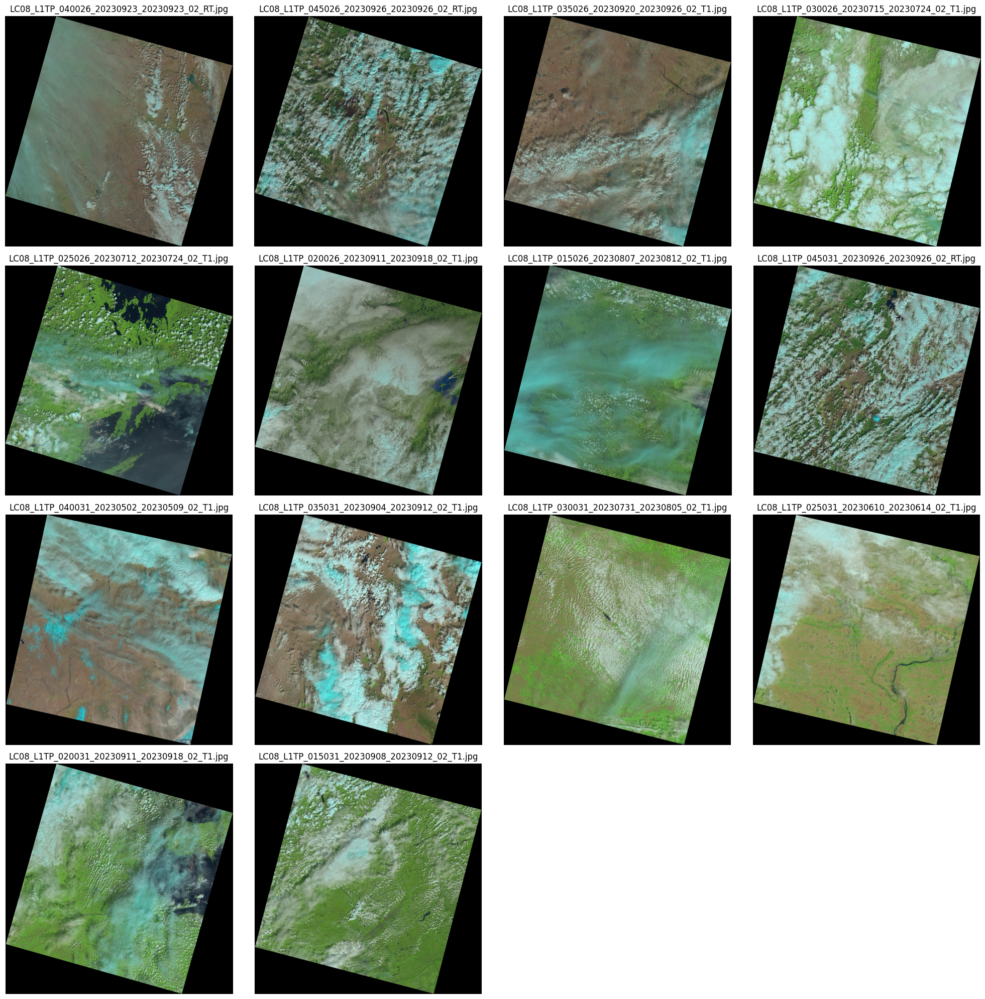

In [ ]:
import math
# Set the root directory
root_dir = '/content/drive/MyDrive/16879/classification/landsat_ot_c2_l1_data/'

# Get the total number of .jpg images
total_images = sum(1 for _, _, files in os.walk(root_dir) for file in files if file.endswith('.jpg'))

# Calculate grid size
grid_size = math.ceil(math.sqrt(total_images))

# Initialize a figure
fig = plt.figure(figsize=(20, 20))

# Counter for the subplot position
i = 1

# Walk through the directory
for dirs, _, files in os.walk(root_dir):
    for file in files:
        if file.endswith('.jpg'):
            # Build the full file path
            file_path = os.path.join(dirs, file)

            # Read and display the image
            img = mpimg.imread(file_path)
            ax = fig.add_subplot(grid_size, grid_size, i)  # Set grid size dynamically
            ax.imshow(img)
            ax.axis('off')  # Hide axes
            ax.set_title(file)  # Set title as the file name

            # Increment subplot position counter
            i += 1

# Adjust layout and show the figure
plt.tight_layout()
plt.show()


# Region Classification

In [ ]:
# Pretrained Models
# https://livingatlas.arcgis.com/en/browse/?q=dlpk%20classification#d=2&q=dlpk+classification

# Load metadata
metadata_path = "/content/drive/MyDrive/16879/classification/landsat_ot_c2_l1_metadata.csv"
metadata = pd.read_csv(metadata_path)

# Prepare image paths
metadata['image_path'] = metadata.apply(
    lambda row: f"/content/drive/MyDrive/16879/classification/landsat_ot_c2_l1_data/{row['WRS_PATH']}_{row['WRS_ROW']}/{row['LANDSAT_PRODUCT_ID']}.jpg",
    axis=1
)

# Enumerate regions
metadata['region_label'] = metadata['WRS_PATH'].astype(str) + "_" + metadata['WRS_ROW'].astype(str)
metadata['region_enum'] = metadata['region_label'].astype('category').cat.codes

metadata.head(12)

,LANDSAT_PRODUCT_ID,WRS_PATH,WRS_ROW,DATE_ACQUIRED,SCENE_CENTER_TIME,CLOUD_COVER,CLOUD_COVER_LAND,ROLL_ANGLE,EARTH_SUN_DISTANCE,MAP_PROJECTION,...,CORNER_UL_LON_PRODUCT,CORNER_UR_LAT_PRODUCT,CORNER_UR_LON_PRODUCT,CORNER_LL_LAT_PRODUCT,CORNER_LL_LON_PRODUCT,CORNER_LR_LAT_PRODUCT,CORNER_LR_LON_PRODUCT,image_path,region_label,region_enum
0,LC08_L1TP_015026_20230807_20230812_02_T1,15,26,2023-08-07,15:43:31.3451260Z,91.72,91.72,-0.001,1.014173,UTM,...,-74.94844,49.88808,-71.70317,47.81104,-74.95058,47.76752,-71.83956,/content/drive/MyDrive/16879/classification/la...,15_26,0
1,LC08_L1TP_020031_20230911_20230918_02_T1,20,31,2023-09-11,16:16:34.9590290Z,74.57,74.57,-0.001,1.006787,UTM,...,-85.17322,42.86491,-82.27315,40.63164,-85.03529,40.69564,-82.23094,/content/drive/MyDrive/16879/classification/la...,20_31,2
2,LC08_L1TP_020026_20230911_20230918_02_T1,20,26,2023-09-11,16:14:35.5292450Z,85.29,85.29,-0.001,1.006787,UTM,...,-82.72897,49.92717,-79.43954,47.77211,-82.65638,47.77433,-79.50506,/content/drive/MyDrive/16879/classification/la...,20_26,1
3,LC08_L1TP_020031_20230911_20230918_02_T1,20,31,2023-09-11,16:16:34.9590290Z,74.57,74.57,-0.001,1.006787,UTM,...,-85.17322,42.86491,-82.27315,40.63164,-85.03529,40.69564,-82.23094,/content/drive/MyDrive/16879/classification/la...,20_31,2
4,LC08_L1TP_025031_20230610_20230614_02_T1,25,31,2023-06-10,16:46:53.0851440Z,51.17,51.17,-0.001,1.015217,UTM,...,-92.78959,42.78064,-89.97313,40.71284,-92.79637,40.67583,-90.07044,/content/drive/MyDrive/16879/classification/la...,25_31,3
5,LC08_L1TP_030026_20230715_20230724_02_T1,30,26,2023-07-15,17:16:04.5611110Z,89.68,89.68,-0.001,1.016498,UTM,...,-98.09555,49.86958,-94.87336,47.82937,-98.13283,47.76439,-95.04291,/content/drive/MyDrive/16879/classification/la...,30_26,4
6,LC08_L1TP_030031_20230731_20230805_02_T1,30,31,2023-07-31,17:18:11.9021000Z,55.97,55.97,-0.001,1.015089,UTM,...,-100.56556,42.81345,-97.71445,40.67876,-100.51461,40.68199,-97.75629,/content/drive/MyDrive/16879/classification/la...,30_31,5
7,LC08_L1TP_035026_20230920_20230926_02_T1,35,26,2023-09-20,17:47:20.4770310Z,57.60,57.60,-0.001,1.004330,UTM,...,-105.88061,49.91039,-102.61270,47.79176,-105.84385,47.77205,-102.71228,/content/drive/MyDrive/16879/classification/la...,35_26,6
8,LC08_L1TP_035031_20230904_20230912_02_T1,35,31,2023-09-04,17:49:14.0855360Z,57.24,57.24,-0.001,1.008506,UTM,...,-108.32247,42.84685,-105.43568,40.64666,-108.21326,40.69063,-105.42133,/content/drive/MyDrive/16879/classification/la...,35_31,7
9,LC08_L1TP_040031_20230502_20230509_02_T1,40,31,2023-05-02,18:19:37.2781410Z,54.35,54.35,-0.001,1.007748,UTM,...,-115.99320,42.76287,-113.19680,40.72782,-116.02543,40.67319,-113.31822,/content/drive/MyDrive/16879/classification/la...,40_31,8


In [ ]:
# Split data
train_df, test_df = train_test_split(metadata, test_size=0.2, random_state=42)

# Image preprocessing function
IMG_WIDTH = 128
IMG_HEIGHT = 128
def preprocess_image(file_path):
    img = load_img(file_path, target_size=(IMG_WIDTH, IMG_HEIGHT))
    img_array = img_to_array(img)
    return img_array / 255.0

# Preprocess images
X_train = np.stack(train_df['image_path'].apply(preprocess_image))
X_test = np.stack(test_df['image_path'].apply(preprocess_image))
y_train = train_df['region_enum'].values
y_test = test_df['region_enum'].values

# Flatten images
X_train_flat = X_train.reshape(X_train.shape[0], -1)
X_test_flat = X_test.reshape(X_test.shape[0], -1)

# Train SVM classifier
svm_clf = SVC(kernel='linear', probability=True, random_state=42)
svm_clf.fit(X_train_flat, y_train)

SVC(kernel='linear', probability=True, random_state=42)

In [ ]:
# Predictions
train_predictions = svm_clf.predict(X_train_flat)
test_predictions = svm_clf.predict(X_test_flat)

# Evaluation
train_accuracy = accuracy_score(y_train, train_predictions)
test_accuracy = accuracy_score(y_test, test_predictions)
print(f"Training Accuracy: {train_accuracy}")
print(f"Test Accuracy: {test_accuracy}")

train_report = classification_report(y_train, train_predictions)
test_report = classification_report(y_test, test_predictions)
print("Training Classification Report:")
print(train_report)
print("Test Classification Report:")
print(test_report)

Training Accuracy: 1.0
Test Accuracy: 0.0
Training Classification Report:
              precision    recall  f1-score   support

           1       1.00      1.00      1.00         1
           2       1.00      1.00      1.00         2
           3       1.00      1.00      1.00         1
           4       1.00      1.00      1.00         1
           5       1.00      1.00      1.00         1
           6       1.00      1.00      1.00         1
           7       1.00      1.00      1.00         1
          10       1.00      1.00      1.00         1

    accuracy                           1.00         9
   macro avg       1.00      1.00      1.00         9
weighted avg       1.00      1.00      1.00         9

Test Classification Report:
              precision    recall  f1-score   support

           0       0.00      0.00      0.00       1.0
           3       0.00      0.00      0.00       0.0
           6       0.00      0.00      0.00       0.0
           8       0.00      0

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.

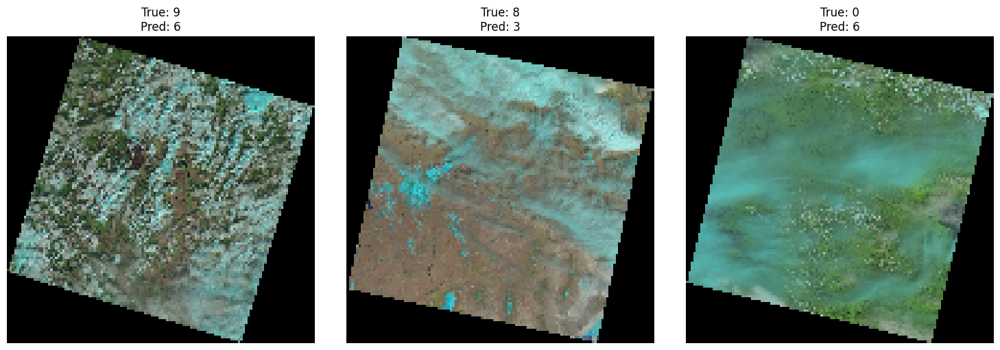

In [ ]:
# Visualization function
def visualize_predictions(images, true_labels, predicted_labels):
    fig, axes = plt.subplots(1, len(images), figsize=(15, 5))
    for img, true_label, pred_label, ax in zip(images, true_labels, predicted_labels, axes):
        ax.imshow(img)
        ax.set_title(f"True: {true_label}\nPred: {pred_label}")
        ax.axis('off')
    plt.tight_layout()
    plt.show()

# Visualize predictions
sample_images = X_test[:3]
sample_true_labels = y_test[:3]
sample_predictions = test_predictions[:3]
visualize_predictions(sample_images, sample_true_labels, sample_predictions)

In [ ]:
# Training with ResNet
# Image preprocessing function
def preprocess_image(file_path):
    img = Image.open(file_path)
    img = img.resize((224, 224))
    return img

# Preprocess images
images = [preprocess_image(path) for path in metadata['image_path']]
labels = metadata['region_enum'].values

# Define base transform for normalization
base_transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])  # ImageNet normalization
])

# Convert original images to tensors without augmentation
original_images = [base_transform(img) for img in images]
original_dataset = TensorDataset(torch.stack(original_images), torch.tensor(labels))

# Data Augmentation
aug_transforms = transforms.Compose([
    transforms.RandomHorizontalFlip(p=0.5),
    transforms.RandomVerticalFlip(p=0.5),
    transforms.RandomRotation(30),
    transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2, hue=0.1),
    transforms.RandomResizedCrop(224, scale=(0.8, 1.0)),
    base_transform  # Apply base transform for normalization
])

num_aug_samples = 10

augmented_images = []
augmented_labels = []

for img, label in zip(images, labels):
    for _ in range(num_aug_samples):
        augmented_images.append(aug_transforms(img))
        augmented_labels.append(label)

# Convert augmented images to tensors
augmented_dataset = TensorDataset(torch.stack(augmented_images), torch.tensor(augmented_labels))

# Split data
train_size = int(0.8 * len(augmented_dataset))
test_size = len(original_dataset)  # Use original (non-augmented) dataset for testing

train_dataset, _ = random_split(augmented_dataset, [train_size, len(augmented_dataset) - train_size])
_, test_dataset = random_split(original_dataset, [len(original_dataset) - test_size, test_size])

train_loader = DataLoader(train_dataset, batch_size=4, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=4)

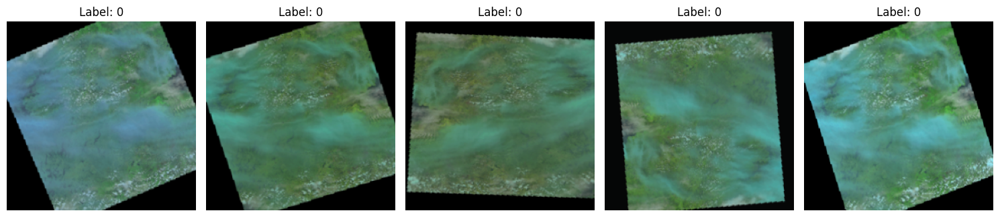

In [ ]:
# Augmented Data
def visualize_images(img_list, label_list):
    fig, axes = plt.subplots(1, len(img_list), figsize=(15, 5))
    for img, ax, label in zip(img_list, axes, label_list):
        img = img.numpy().transpose((1, 2, 0))
        mean = np.array([0.485, 0.456, 0.406])
        std = np.array([0.229, 0.224, 0.225])
        img = std * img + mean
        img = np.clip(img, 0, 1)
        ax.imshow(img)
        ax.set_title(f"Label: {label}")
        ax.axis('off')
    plt.tight_layout()
    plt.show()

# Visualize some augmented images
sample_idx = 0  # Index of the image you'd like to visualize
sample_images = [aug_transforms(images[sample_idx]) for _ in range(5)]  # Augment the chosen image 5 times
sample_labels = [labels[sample_idx]] * 5  # Repeated label for augmented samples

visualize_images(sample_images, sample_labels)

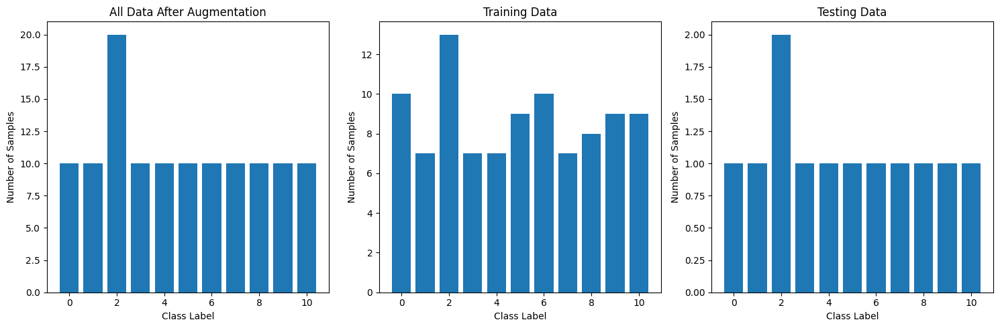

In [ ]:
# Function to plot class distribution side-by-side
def plot_class_distributions(datasets, titles):
    plt.figure(figsize=(15, 5))

    for i, (data, title) in enumerate(zip(datasets, titles)):
        plt.subplot(1, 3, i+1)
        unique, counts = np.unique(data, return_counts=True)
        plt.bar(unique, counts)
        plt.title(title)
        plt.xlabel('Class Label')
        plt.ylabel('Number of Samples')

    plt.tight_layout()
    plt.show()

# Gather datasets
all_data = [augmented_labels, [label for _, label in train_dataset], [label for _, label in test_dataset]]

# Plot side-by-side
plot_class_distributions(
    all_data,
    ['All Data After Augmentation', 'Training Data', 'Testing Data']
)


In [ ]:
# Visualize predictions
def visualize_predictions(images, true_labels, predicted_labels):
    fig, axes = plt.subplots(1, len(images), figsize=(15, 5))
    for img, true_label, pred_label, ax in zip(images, true_labels, predicted_labels, axes):
        img = img.numpy().transpose((1, 2, 0))
        mean = np.array([0.485, 0.456, 0.406])
        std = np.array([0.229, 0.224, 0.225])
        img = std * img + mean
        img = np.clip(img, 0, 1)
        ax.imshow(img)
        ax.set_title(f"True: {true_label}\nPred: {pred_label}")
        ax.axis('off')
    plt.tight_layout()
    plt.show()

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth
100%|██████████| 44.7M/44.7M [00:00<00:00, 135MB/s]


Epoch 1/10 Train Loss: 2.1691 Train Acc: 0.3750 Test Loss: 16.8293 Test Acc: 0.0833
Epoch 2/10 Train Loss: 1.8043 Train Acc: 0.3438 Test Loss: 2.6614 Test Acc: 0.5833
Epoch 3/10 Train Loss: 1.2292 Train Acc: 0.5729 Test Loss: 1.3430 Test Acc: 0.5833
Epoch 4/10 Train Loss: 1.1153 Train Acc: 0.6250 Test Loss: 0.5807 Test Acc: 0.7500
Epoch 5/10 Train Loss: 1.3416 Train Acc: 0.5833 Test Loss: 4.9742 Test Acc: 0.1667
Epoch 6/10 Train Loss: 0.9749 Train Acc: 0.6354 Test Loss: 2.1916 Test Acc: 0.5833
Epoch 7/10 Train Loss: 0.8544 Train Acc: 0.7292 Test Loss: 0.6091 Test Acc: 0.8333
Epoch 8/10 Train Loss: 0.7480 Train Acc: 0.7396 Test Loss: 1.6630 Test Acc: 0.6667
Epoch 9/10 Train Loss: 0.6807 Train Acc: 0.7812 Test Loss: 1.1265 Test Acc: 0.6667
Epoch 10/10 Train Loss: 0.6109 Train Acc: 0.8333 Test Loss: 27.1913 Test Acc: 0.4167


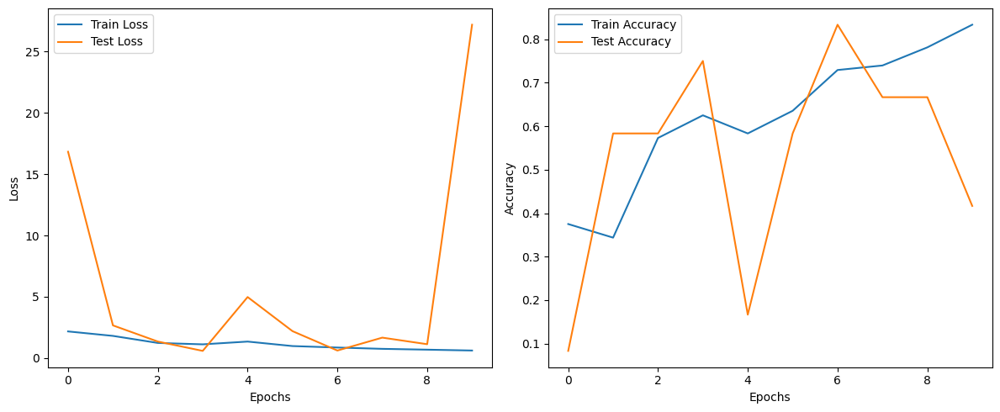

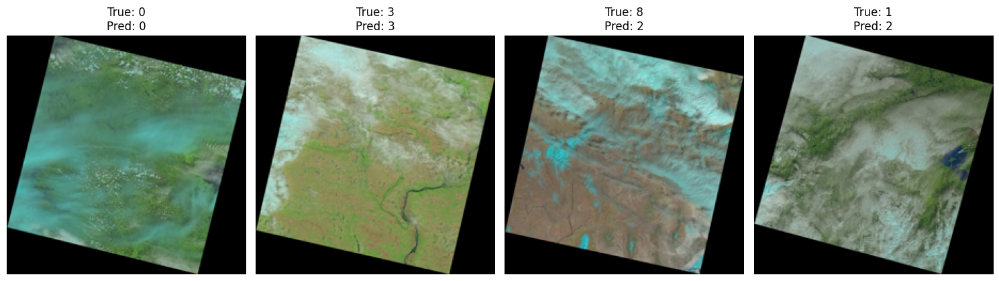

In [ ]:
# Model, training, and evaluation
model = models.resnet18(pretrained=True)
num_ftrs = model.fc.in_features
model.fc = nn.Linear(num_ftrs, len(metadata['region_enum'].unique()))

criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=0.001)

num_epochs = 10

# Lists to store training and testing metrics
train_losses = []
test_losses = []
train_accuracies = []
test_accuracies = []

for epoch in range(num_epochs):
    model.train()
    running_loss = 0.0
    correct_train = 0
    total_train = 0

    for inputs, labels in train_loader:
        optimizer.zero_grad()
        outputs = model(inputs)
        loss = criterion(outputs, labels.long())
        loss.backward()
        optimizer.step()
        running_loss += loss.item() * inputs.size(0)

        _, predicted = outputs.max(1)
        total_train += labels.size(0)
        correct_train += (predicted == labels).sum().item()

    train_acc = correct_train / total_train
    epoch_loss = running_loss / len(train_loader.dataset)
    train_losses.append(epoch_loss)
    train_accuracies.append(train_acc)
    # print(f"Epoch {epoch+1}/{num_epochs} Loss: {epoch_loss:.4f}")

    # Testing
    model.eval()
    test_loss = 0.0
    correct_test = 0
    total_test = 0
    with torch.no_grad():
        for inputs, labels in test_loader:
            outputs = model(inputs)
            loss = criterion(outputs, labels.long())
            test_loss += loss.item() * inputs.size(0)

            _, predicted = outputs.max(1)
            total_test += labels.size(0)
            correct_test += (predicted == labels).sum().item()

    test_acc = correct_test / total_test
    test_loss = test_loss / len(test_loader.dataset)
    test_losses.append(test_loss)
    test_accuracies.append(test_acc)

    print(f"Epoch {epoch+1}/{num_epochs} Train Loss: {epoch_loss:.4f} Train Acc: {train_acc:.4f} Test Loss: {test_loss:.4f} Test Acc: {test_acc:.4f}")

# Plot training and testing curves
plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.plot(train_losses, label='Train Loss')
plt.plot(test_losses, label='Test Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(train_accuracies, label='Train Accuracy')
plt.plot(test_accuracies, label='Test Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()

plt.tight_layout()
plt.show()

# Visualize Predictions
samples, sample_labels = next(iter(test_loader))
sample_outputs = model(samples)
_, sample_predictions = sample_outputs.max(1)
visualize_predictions(samples, sample_labels, sample_predictions)


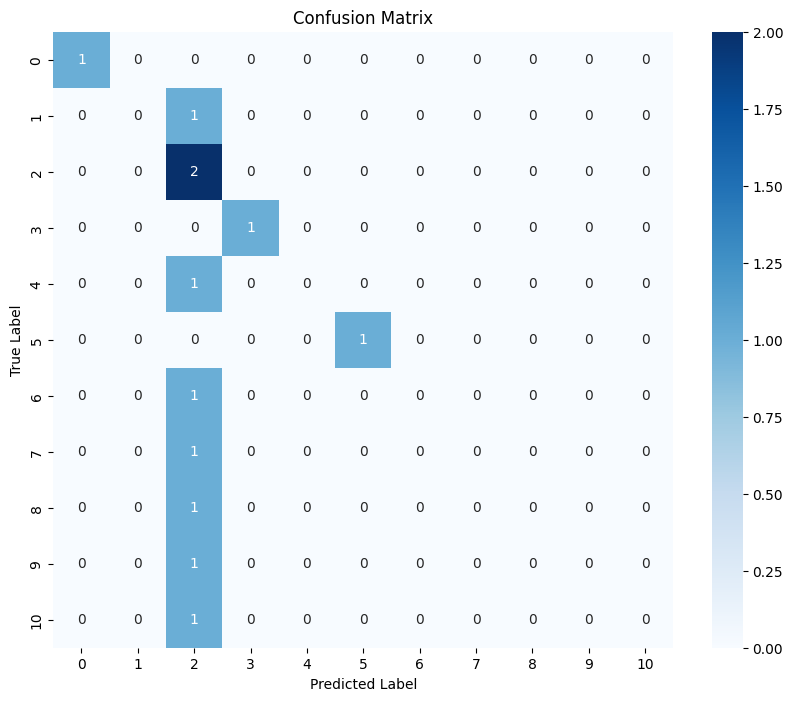

In [ ]:
# Compute the confusion matrix
all_true_labels = []
all_predicted_labels = []
with torch.no_grad():
    for inputs, labels in test_loader:
        outputs = model(inputs)
        _, predicted = outputs.max(1)
        all_true_labels.extend(labels.numpy())
        all_predicted_labels.extend(predicted.numpy())

conf_matrix = confusion_matrix(all_true_labels, all_predicted_labels)

# Plot the heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.title('Confusion Matrix')
plt.show()


# Map Visualization

In [ ]:
metadata

,LANDSAT_PRODUCT_ID,WRS_PATH,WRS_ROW,DATE_ACQUIRED,SCENE_CENTER_TIME,CLOUD_COVER,CLOUD_COVER_LAND,ROLL_ANGLE,EARTH_SUN_DISTANCE,MAP_PROJECTION,...,CORNER_UL_LON_PRODUCT,CORNER_UR_LAT_PRODUCT,CORNER_UR_LON_PRODUCT,CORNER_LL_LAT_PRODUCT,CORNER_LL_LON_PRODUCT,CORNER_LR_LAT_PRODUCT,CORNER_LR_LON_PRODUCT,image_path,region_label,region_enum
0,LC08_L1TP_015026_20230807_20230812_02_T1,15,26,2023-08-07,15:43:31.3451260Z,91.72,91.72,-0.001,1.014173,UTM,...,-74.94844,49.88808,-71.70317,47.81104,-74.95058,47.76752,-71.83956,/content/drive/MyDrive/16879/classification/la...,15_26,0
1,LC08_L1TP_020031_20230911_20230918_02_T1,20,31,2023-09-11,16:16:34.9590290Z,74.57,74.57,-0.001,1.006787,UTM,...,-85.17322,42.86491,-82.27315,40.63164,-85.03529,40.69564,-82.23094,/content/drive/MyDrive/16879/classification/la...,20_31,2
2,LC08_L1TP_020026_20230911_20230918_02_T1,20,26,2023-09-11,16:14:35.5292450Z,85.29,85.29,-0.001,1.006787,UTM,...,-82.72897,49.92717,-79.43954,47.77211,-82.65638,47.77433,-79.50506,/content/drive/MyDrive/16879/classification/la...,20_26,1
3,LC08_L1TP_020031_20230911_20230918_02_T1,20,31,2023-09-11,16:16:34.9590290Z,74.57,74.57,-0.001,1.006787,UTM,...,-85.17322,42.86491,-82.27315,40.63164,-85.03529,40.69564,-82.23094,/content/drive/MyDrive/16879/classification/la...,20_31,2
4,LC08_L1TP_025031_20230610_20230614_02_T1,25,31,2023-06-10,16:46:53.0851440Z,51.17,51.17,-0.001,1.015217,UTM,...,-92.78959,42.78064,-89.97313,40.71284,-92.79637,40.67583,-90.07044,/content/drive/MyDrive/16879/classification/la...,25_31,3
5,LC08_L1TP_030026_20230715_20230724_02_T1,30,26,2023-07-15,17:16:04.5611110Z,89.68,89.68,-0.001,1.016498,UTM,...,-98.09555,49.86958,-94.87336,47.82937,-98.13283,47.76439,-95.04291,/content/drive/MyDrive/16879/classification/la...,30_26,4
6,LC08_L1TP_030031_20230731_20230805_02_T1,30,31,2023-07-31,17:18:11.9021000Z,55.97,55.97,-0.001,1.015089,UTM,...,-100.56556,42.81345,-97.71445,40.67876,-100.51461,40.68199,-97.75629,/content/drive/MyDrive/16879/classification/la...,30_31,5
7,LC08_L1TP_035026_20230920_20230926_02_T1,35,26,2023-09-20,17:47:20.4770310Z,57.60,57.60,-0.001,1.004330,UTM,...,-105.88061,49.91039,-102.61270,47.79176,-105.84385,47.77205,-102.71228,/content/drive/MyDrive/16879/classification/la...,35_26,6
8,LC08_L1TP_035031_20230904_20230912_02_T1,35,31,2023-09-04,17:49:14.0855360Z,57.24,57.24,-0.001,1.008506,UTM,...,-108.32247,42.84685,-105.43568,40.64666,-108.21326,40.69063,-105.42133,/content/drive/MyDrive/16879/classification/la...,35_31,7
9,LC08_L1TP_040031_20230502_20230509_02_T1,40,31,2023-05-02,18:19:37.2781410Z,54.35,54.35,-0.001,1.007748,UTM,...,-115.99320,42.76287,-113.19680,40.72782,-116.02543,40.67319,-113.31822,/content/drive/MyDrive/16879/classification/la...,40_31,8


In [ ]:
# Constants
image_folder = '/content/drive/MyDrive/16879/classification/landsat_ot_c2_l1_data/'
resize_scale = 0.05  # Reduce size by half; adjust as necessary

# Get the grid dimensions
min_path = metadata['WRS_PATH'].min()
min_row = metadata['WRS_ROW'].min()
max_path = metadata['WRS_PATH'].max()
max_row = metadata['WRS_ROW'].max()

grid_height = max_row - min_row + 1
grid_width = max_path - min_path + 1

# Assume that all images are of the same size for simplicity
sample_image_path = os.path.join(image_folder, '15_26', metadata['LANDSAT_PRODUCT_ID'].iloc[0] + '.jpg')
sample_image = cv2.imread(sample_image_path)

# Resize the sample image
sample_image = cv2.resize(sample_image, (int(sample_image.shape[1] * resize_scale), int(sample_image.shape[0] * resize_scale)))

# Image dimensions after resizing
image_height, image_width, _ = sample_image.shape

# Create a black canvas
canvas = np.zeros((image_height * grid_height, image_width * grid_width, 3), dtype=np.uint8)

print(sample_image.shape)

(393, 388, 3)


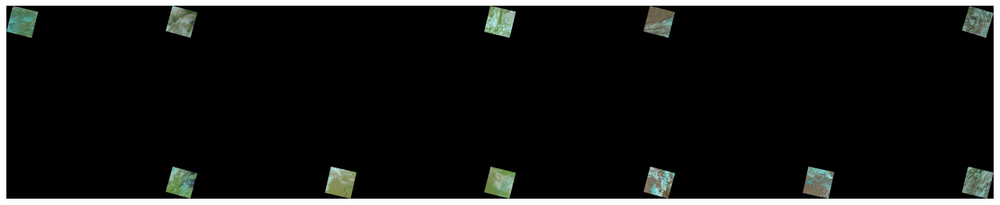

In [ ]:
for _, row in metadata.iterrows():
    subfolder = f"{row['WRS_PATH']}_{row['WRS_ROW']}"
    image_path = os.path.join(image_folder, subfolder, str(row['LANDSAT_PRODUCT_ID']) + '.jpg')
    img = cv2.imread(image_path)

    # Resize the image
    img = cv2.resize(img, (image_width, image_height))

    x = (row['WRS_PATH'] - min_path) * image_width
    y = (row['WRS_ROW'] - min_row) * image_height
    canvas[y:y+image_height, x:x+image_width] = img

# Display the stitched image
plt.figure(figsize=(20, 20))
plt.imshow(cv2.cvtColor(canvas, cv2.COLOR_BGR2RGB))
plt.axis('off')
plt.show()

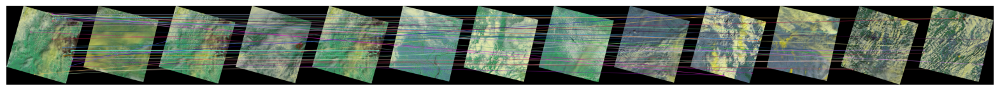

In [ ]:
# 1. Load a random image from the dataset
random_row = metadata.sample(1).iloc[0]
subfolder = f"{random_row['WRS_PATH']}_{random_row['WRS_ROW']}"
random_image_path = os.path.join(image_folder, subfolder, str(random_row['LANDSAT_PRODUCT_ID']) + '.jpg')
random_image = cv2.imread(random_image_path)

# 2. Resize the image to the same scale
random_image_resized = cv2.resize(random_image, (int(random_image.shape[1] * resize_scale), int(random_image.shape[0] * resize_scale)))

# 3. Stitch images together after ensuring all images have the same height
canvas_list = []

# Find the maximum height after resizing all images
max_height = 0
for _, row in metadata.iterrows():
    image_path = os.path.join(image_folder, f"{row['WRS_PATH']}_{row['WRS_ROW']}", str(row['LANDSAT_PRODUCT_ID']) + '.jpg')
    img = cv2.imread(image_path)
    img_resized = cv2.resize(img, (int(img.shape[1] * resize_scale), int(img.shape[0] * resize_scale)))
    max_height = max(max_height, img_resized.shape[0])

for _, row in metadata.iterrows():
    image_path = os.path.join(image_folder, f"{row['WRS_PATH']}_{row['WRS_ROW']}", str(row['LANDSAT_PRODUCT_ID']) + '.jpg')
    img = cv2.imread(image_path)
    img_resized = cv2.resize(img, (int(img.shape[1] * resize_scale), int(img.shape[0] * resize_scale)))
    if img_resized.shape[0] < max_height:
        padding = np.zeros((max_height - img_resized.shape[0], img_resized.shape[1], 3), dtype=np.uint8)
        img_resized = np.vstack((img_resized, padding))
    canvas_list.append(img_resized)

canvas_stitched = np.hstack(canvas_list)


# 4. Detect and describe keypoints in both the random image and the stitched images using ORB
orb = cv2.ORB_create()

# Find the keypoints and descriptors with ORB
keypoints1, descriptors1 = orb.detectAndCompute(random_image_resized, None)
keypoints2, descriptors2 = orb.detectAndCompute(canvas_stitched, None)

# 5. Match the keypoints using the BFMatcher (Brute Force Matcher)
bf = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck=True)
matches = bf.match(descriptors1, descriptors2)
matches = sorted(matches, key=lambda x: x.distance)

# 6. Draw the matches
img_matches = cv2.drawMatches(random_image_resized, keypoints1, canvas_stitched, keypoints2, matches[:50], None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)

plt.figure(figsize=(20, 20))
plt.imshow(img_matches)
plt.axis('off')
plt.show()


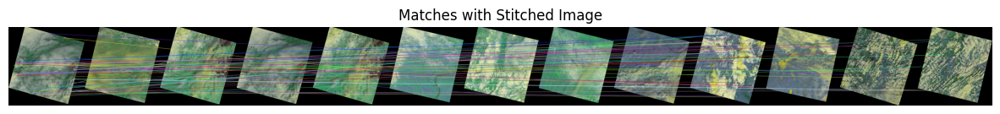

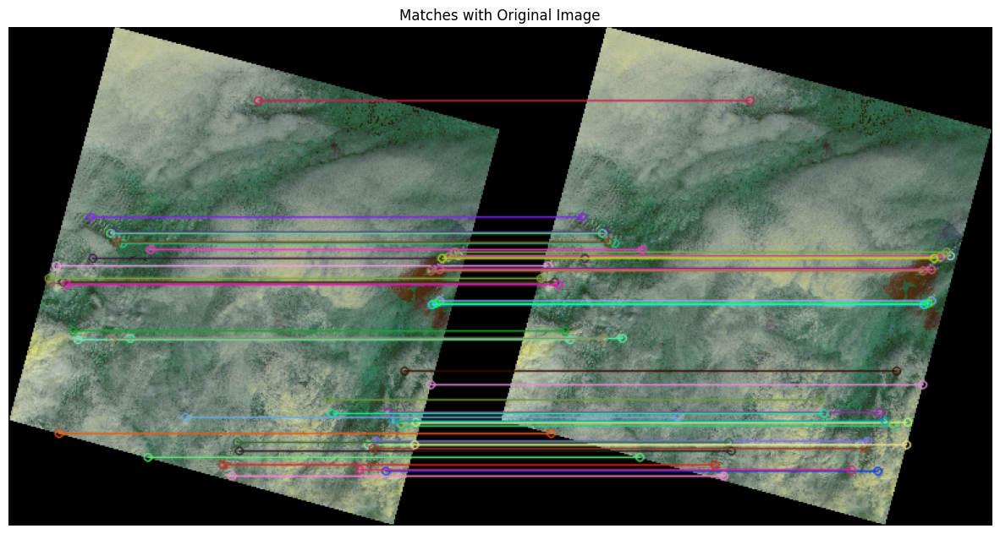

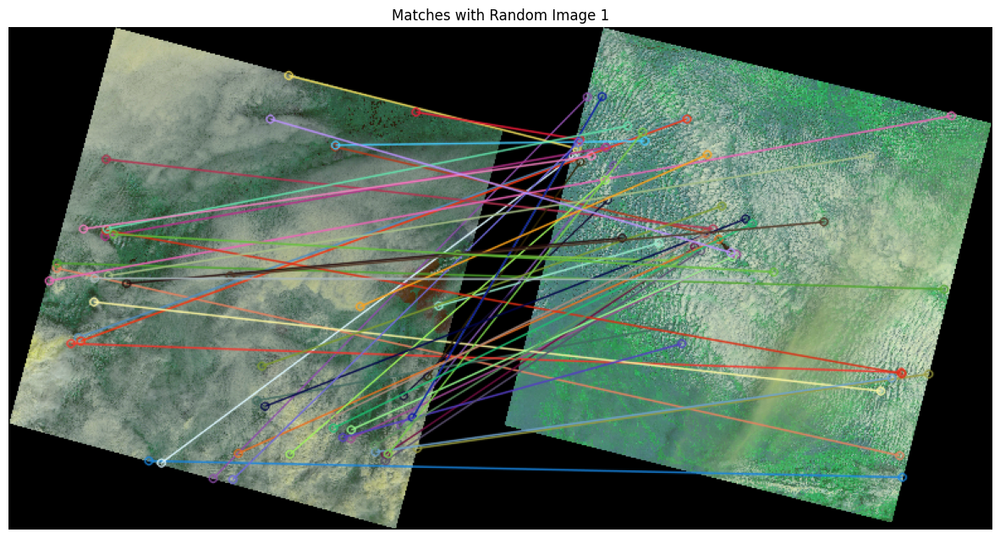

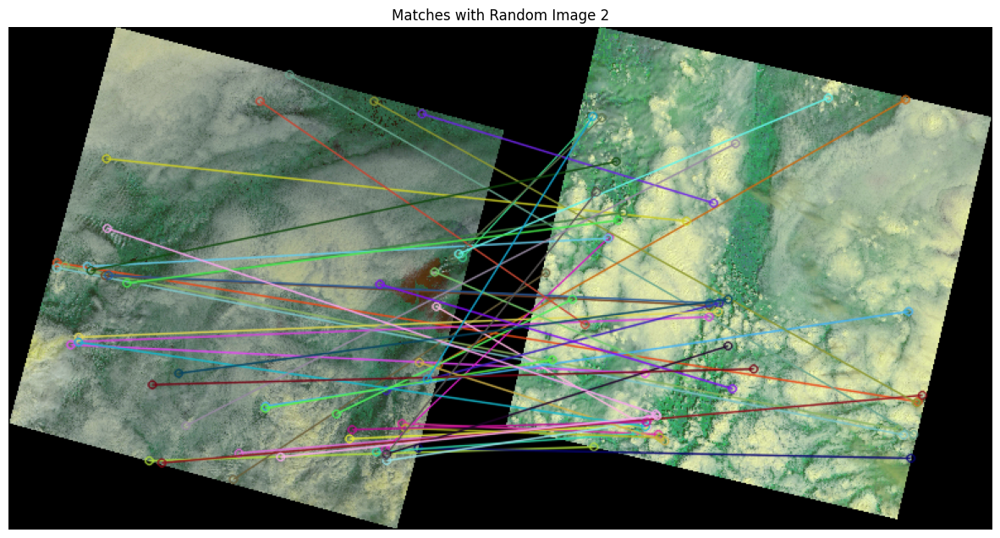

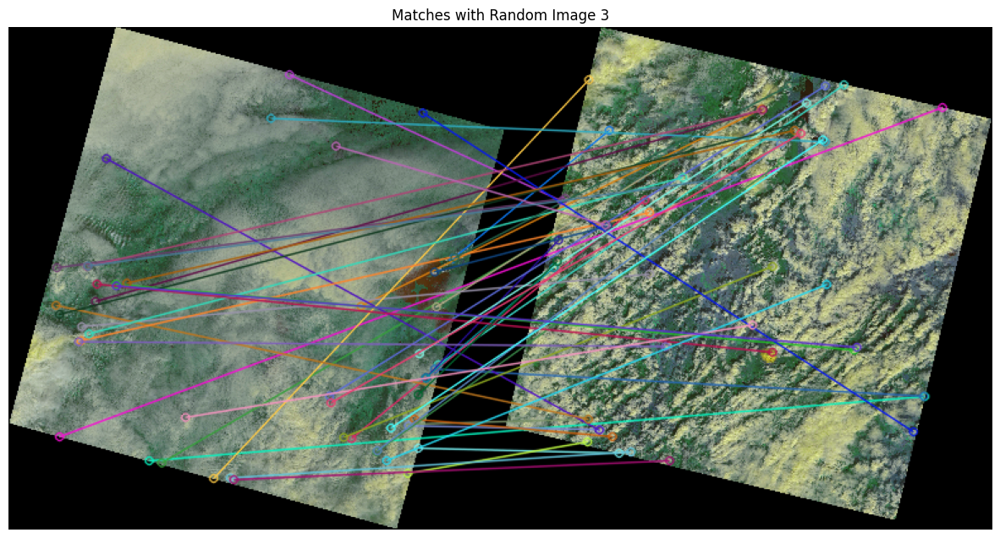

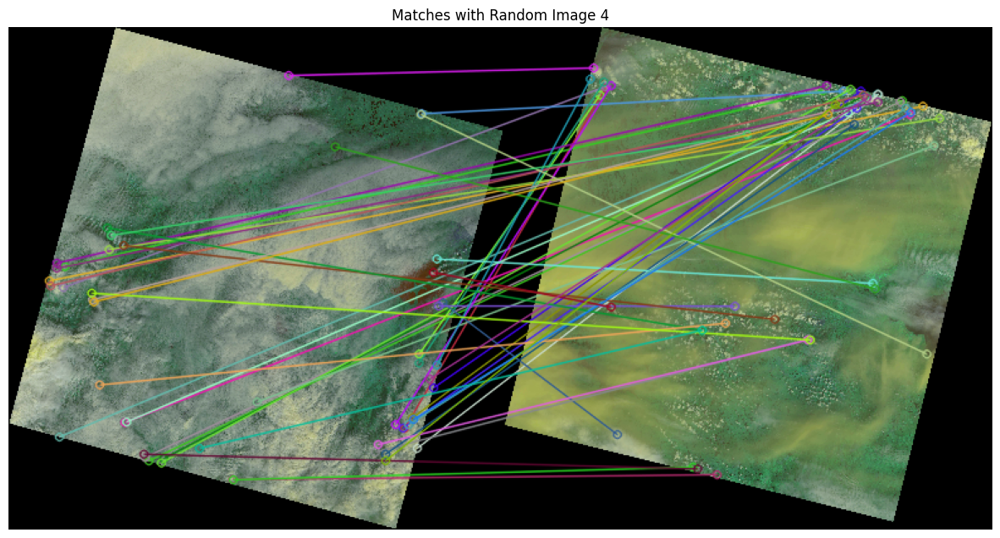

In [ ]:
import random

def match_and_draw(img1, img2):
    """Perform feature matching between two images and draw the matches."""

    # 1. Detect and describe keypoints using ORB
    orb = cv2.ORB_create()

    # Find the keypoints and descriptors with ORB
    keypoints1, descriptors1 = orb.detectAndCompute(img1, None)
    keypoints2, descriptors2 = orb.detectAndCompute(img2, None)

    # 2. Match the keypoints using the BFMatcher (Brute Force Matcher)
    bf = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck=True)
    matches = bf.match(descriptors1, descriptors2)
    matches = sorted(matches, key=lambda x: x.distance)

    # 3. Draw the matches
    img_matches = cv2.drawMatches(img1, keypoints1, img2, keypoints2, matches[:50], None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)

    return img_matches


# Sample and resize the random image
random_row = metadata.sample(1).iloc[0]
subfolder = f"{random_row['WRS_PATH']}_{random_row['WRS_ROW']}"
random_image_path = os.path.join(image_folder, subfolder, str(random_row['LANDSAT_PRODUCT_ID']) + '.jpg')
random_image = cv2.imread(random_image_path)
random_image_resized = cv2.resize(random_image, (int(random_image.shape[1] * resize_scale), int(random_image.shape[0] * resize_scale)))

# Draw matches with the stitched image
img_matches_stitched = match_and_draw(random_image_resized, canvas_stitched)

# Draw matches with the original image
img_matches_original = match_and_draw(random_image_resized, random_image_resized)  # We're using the same image for simplicity. Replace the second argument with the original image.

# Draw matches with four other random images
other_images_matches = []
for _ in range(4):
    other_row = metadata.sample(1).iloc[0]
    other_image_path = os.path.join(image_folder, f"{other_row['WRS_PATH']}_{other_row['WRS_ROW']}", str(other_row['LANDSAT_PRODUCT_ID']) + '.jpg')
    other_image = cv2.imread(other_image_path)
    other_image_resized = cv2.resize(other_image, (int(other_image.shape[1] * resize_scale), int(other_image.shape[0] * resize_scale)))

    img_matches_other = match_and_draw(random_image_resized, other_image_resized)
    other_images_matches.append(img_matches_other)

# Display the results
plt.figure(figsize=(15, 15))
plt.imshow(img_matches_stitched)
plt.title('Matches with Stitched Image')
plt.axis('off')
plt.show()

plt.figure(figsize=(15, 15))
plt.imshow(img_matches_original)
plt.title('Matches with Original Image')
plt.axis('off')
plt.show()

for idx, img_matches in enumerate(other_images_matches, start=1):
    plt.figure(figsize=(15, 15))
    plt.imshow(img_matches)
    plt.title(f'Matches with Random Image {idx}')
    plt.axis('off')
    plt.show()


# Region Classification 2

In [ ]:
pwd

'/content/drive/MyDrive/16873/classification'

In [ ]:
cd /content/drive/MyDrive/Spacecraft-team-vision/New_LandSat_Data

/content/drive/.shortcut-targets-by-id/13GkppKuD0hVUDdJ5Z03O4JkG7tQ1sfXF/Spacecraft-team-vision/New_LandSat_Data


In [ ]:
pwd

'/content/drive/.shortcut-targets-by-id/13GkppKuD0hVUDdJ5Z03O4JkG7tQ1sfXF/Spacecraft-team-vision/New_LandSat_Data'

In [ ]:
ls

25_31.zip  30_31.zip  40_31/          label_encoder.pth                                 test.txt
30_26/     35_26/     45_26/          landsat_rgb_images/
30_26.zip  35_31/     45_31/          LC08_L2SP_025031_20230407_20230420_02_T1_MTL.xml
30_31/     40_26/     file_paths.txt  model.pth


In [ ]:
# !unzip 25_31.zip >/dev/null && unzip 30_26.zip >/dev/null

In [ ]:
# Function to resize an image
def resize_image(image_path, output_size):
    with Image.open(image_path) as img:
        # Resize the image
        resized_img = img.resize(output_size, Image.ANTIALIAS)
        return resized_img

# Set the output size
output_size = (320, 320)

# Resize the first image for testing
# resized_image = resize_image(landsat_image_info[0]['file_path'], output_size)

# Display the resized image
# resized_image.show()


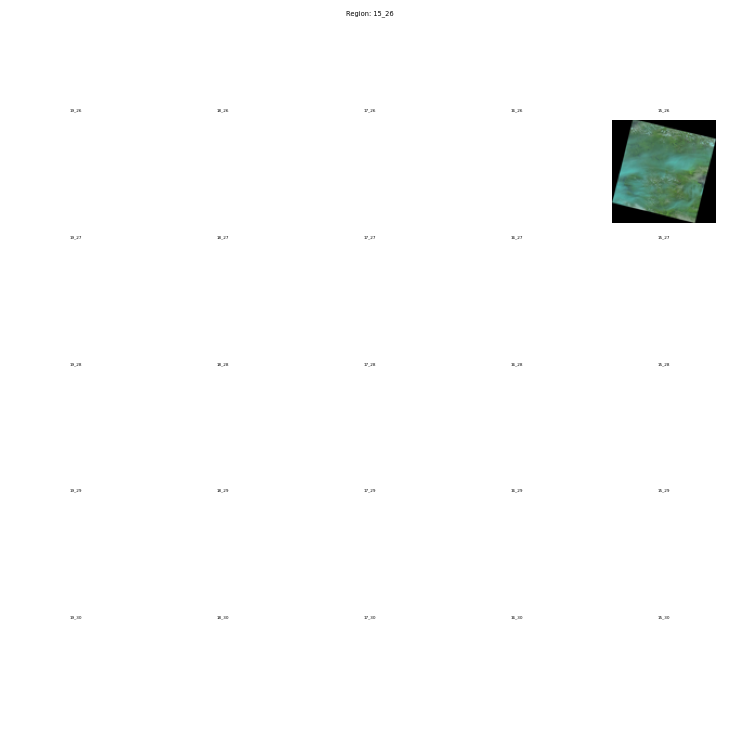

In [ ]:
def create_region_plot_with_images(path, row, size, image_paths=None, plot_scale=1):
    """
    Create a square plot of the specified size with subplots labeled according to path and row,
    and optionally add images to the plot if image paths are provided.
    The size of the plot can be scaled with the plot_scale parameter.

    Args:
    path (int): The starting path number.
    row (int): The starting row number.
    size (int): The size of the square plot.
    image_paths (list, optional): A list of paths to the images that should be displayed within the region.
    plot_scale (float, optional): Scale factor for adjusting the size of the plot.

    The path numbers decrease from left to right, and row numbers increase from top to bottom.
    """
    # Create the figure with subplots
    fig, axs = plt.subplots(size, size, figsize=(size * 5 * plot_scale, size * 5 * plot_scale))
    fig.suptitle(f'Region: {path}_{row}', fontsize=16 * plot_scale)

    # If image paths are provided, create a mapping of the image positions
    if image_paths:
        image_positions = {f"{name_parts[0]}_{name_parts[1]}": img
                           for img in image_paths
                           for name_parts in [img.split('/')[-2].split('_')[:2]]}

    # Loop over each subplot and set its title
    for i in range(size):
        for j in range(size):
            # Calculate the current path and row for this subplot
            current_path = path + size - 1 - j
            current_row = row + i
            label = f"{current_path:02d}_{current_row:02d}"

            # Set the title of the subplot
            axs[i, j].set_title(label, fontsize=10 * plot_scale)
            axs[i, j].axis('off')  # Hide the axes

            # If images are provided and the current label matches an image position, add the image
            if image_paths and label in image_positions:
                image_path = image_positions[label]
                try:
                    image = Image.open(image_path)
                    axs[i, j].imshow(image.resize((int(320 * plot_scale), int(320 * plot_scale))))  # Resize and display the image
                except Exception as e:
                    print(f"Error loading image {image_path}: {e}")

    # Adjust layout
    plt.tight_layout()
    plt.subplots_adjust(top=1 - 0.05 / plot_scale)  # Adjust top spacing based on the scale
    plt.show()

# Example usage with image paths provided and plot scale argument
image_paths_example = [
    "/content/drive/MyDrive/16873/classification/landsat_ot_c2_l1_data/15_26/LC08_L1TP_015026_20230807_20230812_02_T1.jpg",
    # ... other image paths can be added here
]

# Adjust the scale of the plot as needed
create_region_plot_with_images(15, 26, 5, image_paths=image_paths_example, plot_scale=0.3)


In [ ]:
def save_file_paths(directory, output_file):
    """
    Traverse through all folders in the given directory and save all file paths in a text file.

    Args:
    directory (str): The directory to traverse.
    output_file (str): The path to the text file where the paths will be saved.
    """
    with open(output_file, 'w') as file:
        # Walk through the directory
        for root, dirs, files in os.walk(directory):
            for name in files:
                # Write the full path of each file to the text file
                file.write(os.path.join(root, name) + '\n')

# Example usage
# Set the directory you want to traverse and the output text file name
directory_to_traverse = './'  # Replace with your directory path
output_txt_file_name = 'file_paths.txt'  # The text file where paths will be saved

# Set the full output file path
output_file_path = os.path.join(directory_to_traverse, output_txt_file_name)

# Run the function
save_file_paths(directory_to_traverse, output_file_path)

print(f"File paths have been saved to {output_file_path}")


File paths have been saved to ./file_paths.txt


In [ ]:
# https://github.com/cmu-spacecraft-design-build-fly-2023/vision/blob/main/landsat-playground/working-with-RGB-channels.ipynb

# Read the file paths from the provided text file
file_paths_txt = './file_paths.txt'
with open(file_paths_txt, 'r') as file:
    all_paths = [line.strip() for line in file.readlines()]

# Function to resize image
def resize_image(image, scale_percent):
    width = int(image.shape[1] * scale_percent / 100)
    height = int(image.shape[0] * scale_percent / 100)
    dim = (width, height)
    return cv2.resize(image, dim, interpolation=cv2.INTER_AREA)

# A helper function to extract the unique ID from a file path
def extract_unique_id(file_path):
    # This regex pattern assumes that the unique ID is in the form 'LC08_L2SP_025031_20230202_20230209_02_T1'
    pattern = re.compile(r'LC08_L2SP_\d{6}_\d{8}_\d{8}_\d{2}_T1')
    match = pattern.search(file_path)
    if match:
        return match.group()
    return None

# Sort paths into a dictionary with unique IDs as keys and band paths as values
bands_data = {}
for path in all_paths:
    if len(path.split('/')) > 2 and path.endswith('TIF'):
      # print(path)
      unique_id = extract_unique_id(path)
      if unique_id:
          band = path.split('_')[-1].split('.')[0]  # Extract the band from the filename
          band = 'SR_' + band
          if band in ['SR_B2', 'SR_B3', 'SR_B4']:
              # print('Test')
              if unique_id not in bands_data:
                  bands_data[unique_id] = {}
              bands_data[unique_id][band] = path

# Process each set of bands and save as an RGB image
output_folder = './landsat_rgb_images/'
if not os.path.exists(output_folder):
    os.makedirs(output_folder)

for unique_id, band_files in tqdm(bands_data.items()): # 90 images of 10% size (7000 x 7000) took 1 hour
    try:
        # Read the band images
        B2 = tiff.imread(band_files['SR_B2']) if 'SR_B2' in band_files else None
        B3 = tiff.imread(band_files['SR_B3']) if 'SR_B3' in band_files else None
        B4 = tiff.imread(band_files['SR_B4']) if 'SR_B4' in band_files else None
        # B2 = resize_image(tiff.imread(band_files['SR_B2']), 10) if 'SR_B2' in band_files else None
        # B3 = resize_image(tiff.imread(band_files['SR_B3']), 10) if 'SR_B3' in band_files else None
        # B4 = resize_image(tiff.imread(band_files['SR_B4']), 10) if 'SR_B4' in band_files else None

        # Ensure that all bands are present
        if B2 is not None and B3 is not None and B4 is not None:
            # Stack and scale bands to create an RGB image
            RGB = np.dstack((B4, B3, B2))
            RGB = RGB.astype(np.float32)
            RGB = np.clip(RGB * 0.0000275 - 0.2, 0, 1)  # Apply scale factor and offset

            # Save the RGB image
            output_path = os.path.join(output_folder, f"{unique_id}_RGB.jpg")
            Image.fromarray((RGB * 255).astype(np.uint8)).save(output_path)
    except Exception as e:
        print(f"Failed to process {unique_id}: {e}")

# Output the path where the RGB images are saved
output_folder


100%|██████████| 90/90 [19:02<00:00, 12.69s/it]


'./landsat_rgb_images/'

In [ ]:
ls landsat_rgb_images|wc -l

10


In [ ]:
# 100 images = 15m
# 10000 images = 1500m ~ 25 hours
# 100.000 images = 15.000m ~ 250 hours
# Function to calculate the region label based on path and row
# def get_region_label(path, row, region_size=5):
#     # Calculate the region's starting path and row
#     start_path = path - path % region_size
#     start_row = row - row % region_size
#     end_path = start_path + region_size - 1
#     end_row = start_row + region_size - 1
#     # Format the label
#     return f"{start_path}{end_path}_{start_row}{end_row}"

def get_region_label(path, row):
    # Assuming the top right of the region starts at path 15 and row 26
    # and each region spans 5 paths and rows
    start_path = 15
    start_row = 26
    region_size = 5

    # Calculate the region's starting path and row based on the range
    region_start_path = start_path + ((path - start_path) // region_size) * region_size
    region_end_path = region_start_path + region_size - 1
    region_start_row = start_row + ((row - start_row) // region_size) * region_size
    region_end_row = region_start_row + region_size - 1

    # Format the label
    return f"{region_start_path}{region_end_path}_{region_start_row}{region_end_row}"

# A helper function to extract the unique ID from a file path
def extract_unique_id(file_path):
    # This regex pattern assumes that the unique ID is in the form 'LC08_L2SP_025031_20230202_20230209_02_T1'
    pattern = re.compile(r'LC08_L2SP_(\d{3})(\d{3})_\d{8}_\d{8}_\d{2}_T1')
    match = pattern.search(file_path)
    if match:
        path, row = map(int, match.groups())
        region_label = get_region_label(path, row)
        # print(file_path, region_label)
        return match.group(), region_label
    return None, None

# Function to resize image
def resize_image(image, scale_percent):
    width = int(image.shape[1] * scale_percent / 100)
    height = int(image.shape[0] * scale_percent / 100)
    dim = (width, height)
    return cv2.resize(image, dim, interpolation=cv2.INTER_AREA)

# Process each set of bands and save as an RGB image
base_output_folder = './landsat_rgb_images/'
if not os.path.exists(base_output_folder):
    os.makedirs(base_output_folder)

for path in tqdm(all_paths):
    if path.endswith('.TIF'):
        try:
            unique_id, region_label = extract_unique_id(path)
            # print(unique_id, region_label)
            if unique_id:
                # Define the output folder for the region
                output_folder = os.path.join(base_output_folder, region_label)
                if not os.path.exists(output_folder):
                    os.makedirs(output_folder)

                # Read and resize the band images
                band_files = {band: path for band in ['SR_B2', 'SR_B3', 'SR_B4']}
                B2 = resize_image(tiff.imread(band_files['SR_B2']), 10) if 'SR_B2' in band_files else None
                B3 = resize_image(tiff.imread(band_files['SR_B3']), 10) if 'SR_B3' in band_files else None
                B4 = resize_image(tiff.imread(band_files['SR_B4']), 10) if 'SR_B4' in band_files else None

                # Ensure that all bands are present
                if B2 is not None and B3 is not None and B4 is not None:
                    # Stack and scale bands to create an RGB image
                    RGB = np.dstack((B4, B3, B2))
                    RGB = RGB.astype(np.float32)
                    RGB = np.clip(RGB * 0.0000275 - 0.2, 0, 1)  # Apply scale factor and offset

                    # Save the RGB image
                    output_path = os.path.join(output_folder, f"{unique_id}_RGB.jpg")
                    Image.fromarray((RGB * 255).astype(np.uint8)).save(output_path)
        except Exception as e:
            print(f"Failed to process {path}: {e}")

# Output the base path where the RGB images are saved by region
print(base_output_folder)

100%|██████████| 369/369 [15:11<00:00,  2.47s/it]

./landsat_rgb_images/


In [ ]:
# rm -r landsat_rgb_images

In [ ]:
# Path for extracted data
save_file_paths('./landsat_rgb_images/', 'landsat_rgb_images/data.txt')

In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from torchvision import models
from torchvision.models import vision_transformer

In [ ]:
# https://github.com/jerpint/bigearthnet
# Helper functions
def extract_label(file_path):
    # Extract the label from the file path
    return file_path.split('/')[-2]

# Define the dataset class
class LandsatDataset(Dataset):
    def __init__(self, file_paths, labels, transform=None):
        self.file_paths = file_paths
        self.labels = labels
        self.transform = transform

    def __len__(self):
        return len(self.file_paths)

    def __getitem__(self, idx):
        img_path = self.file_paths[idx]
        image = Image.open(img_path)
        label = self.labels[idx]
        if self.transform:
            image = self.transform(image)
        return image, label

# Read the file paths and labels
with open('./landsat_rgb_images/data.txt', 'r') as file:
    file_paths = [line.strip() for line in file.readlines()][1:]
labels = [extract_label(fp) for fp in file_paths if not fp.endswith('txt')]

# Encode the string labels to integers
label_encoder = LabelEncoder()
encoded_labels = label_encoder.fit_transform(labels)

# Split data into train and validation sets
train_paths, val_paths, train_labels, val_labels = train_test_split(
    file_paths, encoded_labels, test_size=0.5, random_state=42
)

# Define transformations
transform = transforms.Compose([
    transforms.Resize((256, 256)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])

transform2 = transforms.Compose([
    transforms.Resize(224),  # Resize to the size expected by the model
    transforms.CenterCrop(224),  # Crop to make sure the images are square
    transforms.ToTensor(),  # Convert to tensor
    # Normalize using the mean and standard deviation of the ImageNet dataset
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])

# Create dataset objects
train_dataset = LandsatDataset(train_paths, train_labels, transform=transform)
val_dataset = LandsatDataset(val_paths, val_labels, transform=transform)
# for ViT only
# train_dataset = LandsatDataset(train_paths, train_labels, transform=transform2)
# val_dataset = LandsatDataset(val_paths, val_labels, transform=transform2)

# Create data loaders
train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=32, shuffle=False)

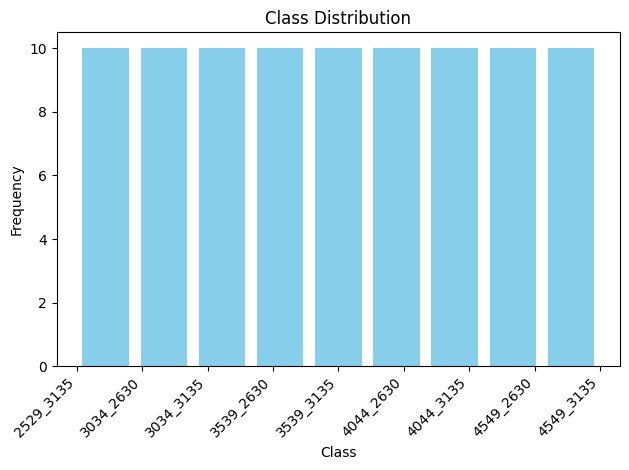

In [ ]:
# Visualize class distribution
fig, ax = plt.subplots()
ax.hist(encoded_labels, bins=len(set(encoded_labels)), rwidth=0.8, color='skyblue')
ax.set_xticks(range(len(label_encoder.classes_)))
ax.set_xticklabels(label_encoder.classes_, rotation=45, ha='right')
ax.set_title('Class Distribution')
ax.set_xlabel('Class')
ax.set_ylabel('Frequency')

plt.tight_layout()
plt.show()

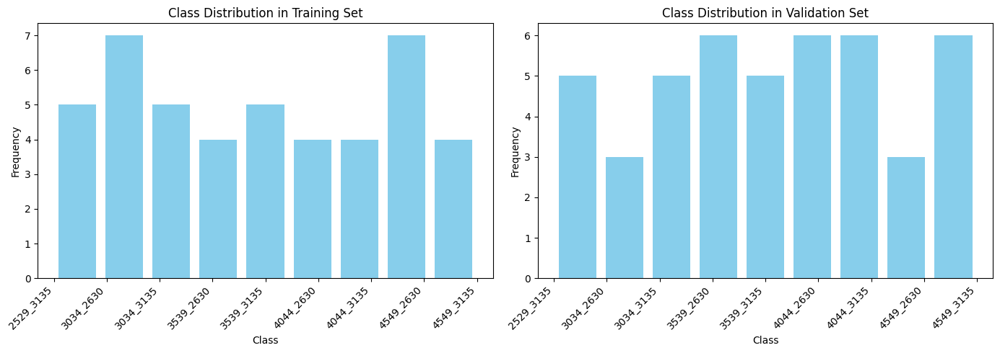

In [ ]:
# Plotting class distributions
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 5))

# Training set class distribution
ax1.hist(train_labels, bins=len(set(encoded_labels)), rwidth=0.8, color='skyblue')
ax1.set_xticks(range(len(label_encoder.classes_)))
ax1.set_xticklabels(label_encoder.classes_, rotation=45, ha='right')
ax1.set_title('Class Distribution in Training Set')
ax1.set_xlabel('Class')
ax1.set_ylabel('Frequency')

# Validation set class distribution
ax2.hist(val_labels, bins=len(set(encoded_labels)), rwidth=0.8, color='skyblue')
ax2.set_xticks(range(len(label_encoder.classes_)))
ax2.set_xticklabels(label_encoder.classes_, rotation=45, ha='right')
ax2.set_title('Class Distribution in Validation Set')
ax2.set_xlabel('Class')
ax2.set_ylabel('Frequency')

plt.tight_layout()
plt.show()

In [ ]:
# Define the CNN model using a pre-trained network
class PretrainedResNet(nn.Module):
    def __init__(self, num_classes):
        super(PretrainedResNet, self).__init__()
        # Load a pre-trained ResNet
        self.resnet = models.resnet101(pretrained=True) # resnet18, resnet34, resnet101,
        # Replace the last fully connected layer
        # Parameters of newly constructed modules have requires_grad=True by default
        # When fine-tuning a pre-trained network, you may choose to freeze the weights of earlier layers to prevent overfitting, especially if your dataset is small.
        # You can freeze the layers by setting requires_grad to False
        num_ftrs = self.resnet.fc.in_features
        self.resnet.fc = nn.Linear(num_ftrs, num_classes)

    def forward(self, x):
        return self.resnet(x)

# Define the CNN model
class SimpleCNN(nn.Module):
    def __init__(self, num_classes):
        super(SimpleCNN, self).__init__()
        self.conv1 = nn.Conv2d(3, 32, kernel_size=3, stride=1, padding=1)
        # Add more layers as needed
        self.fc1 = nn.Linear(32 * 256 * 256, num_classes)

    def forward(self, x):
        x = self.conv1(x)
        # Apply additional layers and activations as needed
        x = x.view(x.size(0), -1)  # Flatten the tensor
        x = self.fc1(x)
        return x

# ViT
class PretrainedVit(nn.Module):
    def __init__(self, num_classes, pretrained=True):
        """
        Initialize a pre-trained Vision Transformer 'vit_h_14' model.

        Args:
            num_classes (int): The number of classes for the final classification layer.
            pretrained (bool): Whether to use pre-trained weights. Defaults to True.
        """
        super(PretrainedVit, self).__init__()
        # Load the pre-trained Vision Transformer model
        self.model = vision_transformer.vit_b_16(pretrained=pretrained) # vit_h_14 vit_l_32 vit_b_16

        # Replace the classifier head with a new one for the given number of classes
        self.model.heads.head = nn.Linear(self.model.heads.head.in_features, num_classes)

    def forward(self, x):
        """
        Forward pass of the model.

        Args:
            x (Tensor): Input tensor.

        Returns:
            Tensor: The model's output.
        """
        return self.model(x)


num_classes = len(set(encoded_labels))
# model = SimpleCNN(num_classes=num_classes)
model = PretrainedResNet(num_classes)
# model = PretrainedVit(num_classes)

# Define loss function and optimizer
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=0.001)

# Move the model to GPU if available
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
model = model.to(device)

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet101_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet101_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/resnet101-63fe2227.pth" to /root/.cache/torch/hub/checkpoints/resnet101-63fe2227.pth
100%|██████████| 171M/171M [00:01<00:00, 102MB/s]


In [ ]:
# # Training loop
# num_epochs = 10  # Set the number of epochs
# for epoch in range(num_epochs):
#     model.train()
#     running_loss = 0.0
#     for images, labels in tqdm(train_loader):
#         images, labels = images.to(device), labels.to(device)

#         optimizer.zero_grad()
#         outputs = model(images)
#         loss = criterion(outputs, labels)
#         loss.backward()
#         optimizer.step()

#         running_loss += loss.item()

#     print(f"Epoch {epoch+1}/{num_epochs}, Loss: {running_loss/len(train_loader)}")

#     # Validation loop
#     model.eval()
#     correct = 0
#     total = 0
#     with torch.no_grad():
#         for images, labels in val_loader:
#             images, labels = images.to(device), labels.to(device)
#             outputs = model(images)
#             _, predicted = torch.max(outputs.data, 1)
#             total += labels.size(0)
#             correct += (predicted == labels).sum().item()

In [ ]:
# labels

In [ ]:
# Step 4: Training Loop
def train(model, train_loader, val_loader, criterion, optimizer, num_epochs=25):
    train_losses = []
    val_accuracies = []
    best_val_accuracy = 0  # Initialize best_val_accuracy
    best_confusion_matrix = None

    for epoch in range(num_epochs):
        model.train()  # Set model to training mode
        running_loss = 0.0
        for images, labels in train_loader:
            images, labels = images.to(device), labels.to(device)
            optimizer.zero_grad()  # Zero the parameter gradients
            outputs = model(images)  # Forward pass
            loss = criterion(outputs, labels)  # Compute loss
            loss.backward()  # Backward pass
            optimizer.step()  # Optimize the model
            running_loss += loss.item() * images.size(0)

        epoch_loss = running_loss / len(train_loader.dataset)
        train_losses.append(epoch_loss)
        print(f'Epoch {epoch+1}/{num_epochs}, Loss: {epoch_loss:.4f}')

        # Validation phase
        model.eval()  # Set model to evaluate mode
        correct = 0
        total = 0
        with torch.no_grad():
            for images, labels in val_loader:
                images, labels = images.to(device), labels.to(device)
                outputs = model(images)
                _, predicted = torch.max(outputs.data, 1)
                total += labels.size(0)
                correct += (predicted == labels).sum().item()

        val_accuracy = 100 * correct / total
        val_accuracies.append(val_accuracy)
        print(f'Validation Accuracy: {val_accuracy:.2f}%')

    print('Finished Training')

    # Plotting the training and validation metrics
    plt.figure(figsize=(12, 4))
    plt.subplot(1, 2, 1)
    plt.plot(train_losses, label='Training Loss')
    plt.title('Training Loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()

    plt.subplot(1, 2, 2)
    plt.plot(val_accuracies, label='Validation Accuracy')
    plt.title('Validation Accuracy')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy (%)')
    plt.legend()

    plt.show()

    # Evaluate on validation set to get the confusion matrix
    model.eval()
    all_preds = []
    all_labels = []
    with torch.no_grad():
        for images, labels in val_loader:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            _, predicted = torch.max(outputs.data, 1)
            all_preds.extend(predicted.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())

    # Compute the confusion matrix
    cm = confusion_matrix(all_labels, all_preds)
    if best_val_accuracy < val_accuracy:
        best_val_accuracy = val_accuracy
        best_confusion_matrix = cm

    # Plot the confusion matrix as a heatmap
    plt.figure(figsize=(8, 8))
    sns.heatmap(best_confusion_matrix, annot=True, fmt='d', cmap='Blues',
                xticklabels=label_encoder.classes_, yticklabels=label_encoder.classes_)
    plt.title('Confusion Matrix')
    plt.ylabel('True Label')
    plt.xlabel('Predicted Label')
    plt.show()

    return train_losses, val_accuracies


Epoch 1/60, Loss: 0.0086
Validation Accuracy: 28.89%
Epoch 2/60, Loss: 0.1199
Validation Accuracy: 33.33%
Epoch 3/60, Loss: 0.1639
Validation Accuracy: 28.89%
Epoch 4/60, Loss: 0.1606
Validation Accuracy: 46.67%
Epoch 5/60, Loss: 0.2658
Validation Accuracy: 44.44%
Epoch 6/60, Loss: 0.1205
Validation Accuracy: 31.11%
Epoch 7/60, Loss: 0.0714
Validation Accuracy: 20.00%
Epoch 8/60, Loss: 0.0371
Validation Accuracy: 17.78%
Epoch 9/60, Loss: 0.0304
Validation Accuracy: 13.33%
Epoch 10/60, Loss: 0.0310
Validation Accuracy: 13.33%
Epoch 11/60, Loss: 0.0495
Validation Accuracy: 20.00%
Epoch 12/60, Loss: 0.0083
Validation Accuracy: 20.00%
Epoch 13/60, Loss: 0.0204
Validation Accuracy: 15.56%
Epoch 14/60, Loss: 0.0217
Validation Accuracy: 11.11%
Epoch 15/60, Loss: 0.0234
Validation Accuracy: 13.33%
Epoch 16/60, Loss: 0.0107
Validation Accuracy: 15.56%
Epoch 17/60, Loss: 0.1774
Validation Accuracy: 33.33%
Epoch 18/60, Loss: 0.0846
Validation Accuracy: 15.56%
Epoch 19/60, Loss: 0.0234
Validation 

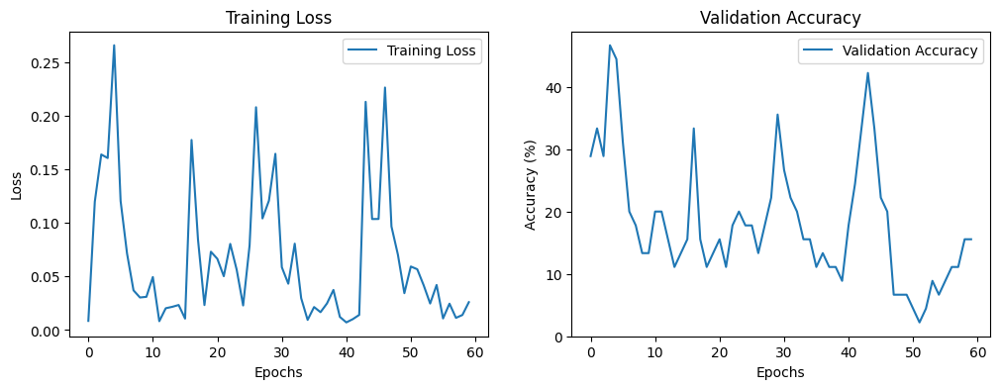

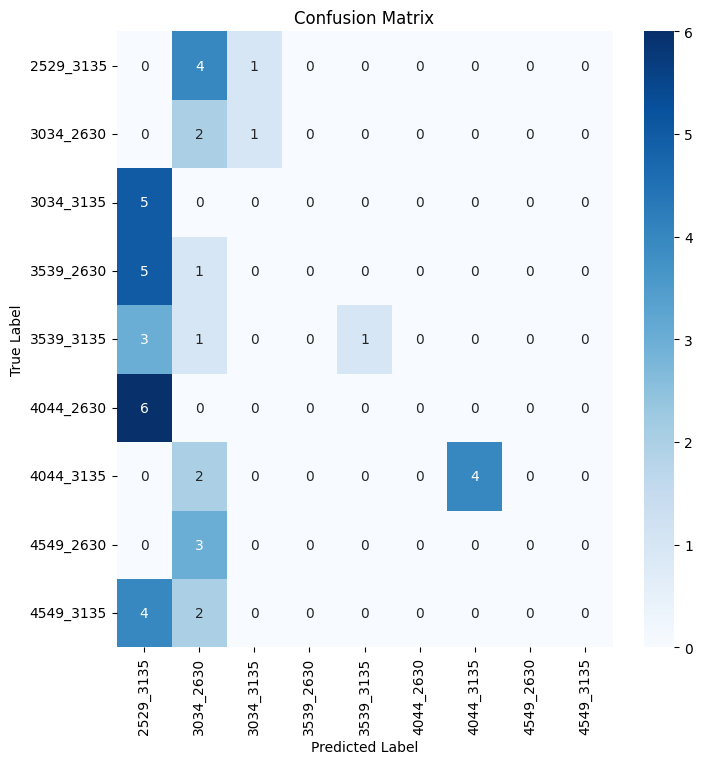

In [ ]:
# Step 5: Train the model
train(model, train_loader, val_loader, criterion, optimizer, num_epochs=60)

# Save the trained model
torch.save(model.state_dict(), './model.pth')

# Save the label encoder to convert between integer labels and actual labels
torch.save(label_encoder, './label_encoder.pth')

In [ ]:
# Homography Transormation Inverse

# Model Optimization

In [ ]:
# Use the ResNet model defined earlier:
import torch.nn.utils.prune as prune
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
model_original = models.resnet18(pretrained=True).to(device)
num_ftrs = model_original.fc.in_features
model_original.fc = nn.Linear(num_ftrs, len(metadata['region_enum'].unique()))

model = models.resnet18(pretrained=True).to(device)
num_ftrs = model.fc.in_features
model.fc = nn.Linear(num_ftrs, len(metadata['region_enum'].unique()))

# Loss and optimizer
criterion = nn.CrossEntropyLoss()
optimizer = optim.SGD(model.parameters(), lr=0.001, momentum=0.9)
optimizer_original = optim.SGD(model_original.parameters(), lr=0.001, momentum=0.9)


/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [ ]:
# print(model)
next(model_original.parameters()).is_cuda

True

In [ ]:
# # Set pruning layers for ResNet
# parameters_to_prune = (
#     (model.layer1[0].conv1, 'weight'),
#     (model.layer1[0].conv2, 'weight'),
#     (model.layer2[0].conv1, 'weight'),
#     (model.layer2[0].conv2, 'weight'),
#     (model.fc, 'weight'),
# )

In [ ]:
def create_mask(pruned_model):
    mask = {}
    for name, module in pruned_model.named_modules():
        if isinstance(module, (nn.Conv2d, nn.Linear)):
            mask[name + '.weight_mask'] = module.weight_mask
    return mask

# Apply the mask to the new model's weights
def apply_mask(model, mask):
    for name, param in model.named_parameters():
        if "weight" in name:
            mask_name = name.replace("weight", "weight_mask")
            if mask_name in mask:
                param.data.mul_(mask[mask_name])

In [ ]:
# Iterative pruning setup
n_epochs = 5
prune_iterations = 3

model_original = model_original.to(device)

# Train the original model
for epoch in range(n_epochs*prune_iterations):
    running_loss = 0.0
    for inputs, labels in train_loader:
        inputs, labels = inputs.to(device), labels.long().to(device)
        optimizer_original.zero_grad()

        outputs = model_original(inputs)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer_original.step()

        running_loss += loss.item()

    print(f'Epoch {epoch + 1}/{n_epochs*3}, Loss: {running_loss / (len(train_loader))}')

# Train and prune iteratively
model = model.to(device)
parameters_to_prune = []

# Add convolutional layers
for name, module in model.named_modules():
    if isinstance(module, nn.Conv2d) or isinstance(module, nn.Linear):
        parameters_to_prune.append((module, 'weight'))

# Train and prune iteratively
prune_iterations = 3
prune_amount = 0.3  # Increase the pruning amount for more aggressive pruning

for prune_iter in range(prune_iterations):
    print(f'Pruning iteration {prune_iter + 1}/{prune_iterations}')

    # Train the model
    for epoch in range(n_epochs):
        running_loss = 0.0
        for inputs, labels in train_loader:
            inputs, labels = inputs.to(device), labels.long().to(device)
            optimizer.zero_grad()

            outputs = model(inputs)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()

            running_loss += loss.item()

        print(f'Epoch {epoch + 1}/{n_epochs}, Loss: {running_loss / (len(train_loader))}')

    # Prune the model
    prune.global_unstructured(
        parameters_to_prune,
        pruning_method=prune.L1Unstructured,
        amount=prune_amount,
    )

    # Report sparsity (For one of the layers as an example, you can expand this)
    print(
    "Sparsity in fc.weight: {:.2f}%".format(
        100. * float(torch.sum(model.fc.weight == 0))
        / float(model.fc.weight.nelement())
        )
    )

#### Create mask ####
mask = create_mask(model)
#####################

for name, module in model.named_modules():
    if isinstance(module, (nn.Conv2d, nn.Linear)):  # This will check for both Conv2d and Linear layers
        prune.remove(module, 'weight')

# non_zero_count = count_non_zero_parameters(model)
# print(f"Number of non-zero parameters: {non_zero_count}")


Epoch 1/15, Loss: 2.5305435558160148
Epoch 2/15, Loss: 1.3282592172424
Epoch 3/15, Loss: 0.5436199797938267
Epoch 4/15, Loss: 0.37167813659956056
Epoch 5/15, Loss: 0.2168962418412169
Epoch 6/15, Loss: 0.1721123355285575
Epoch 7/15, Loss: 0.10874864284414798
Epoch 8/15, Loss: 0.0975821598355348
Epoch 9/15, Loss: 0.11344496378054221
Epoch 10/15, Loss: 0.07959876178453366
Epoch 11/15, Loss: 0.04248192380570496
Epoch 12/15, Loss: 0.09187525250793745
Epoch 13/15, Loss: 0.04558081705666458
Epoch 14/15, Loss: 0.05845904359982038
Epoch 15/15, Loss: 0.07531481693149544
Pruning iteration 1/3
Epoch 1/5, Loss: 2.314807638525963
Epoch 2/5, Loss: 1.1796509300669034
Epoch 3/5, Loss: 0.5171484686434269
Epoch 4/5, Loss: 0.34613383064667386
Epoch 5/5, Loss: 0.14791626840208968
Sparsity in fc.weight: 12.86%
Pruning iteration 2/3
Epoch 1/5, Loss: 0.2394709700408081
Epoch 2/5, Loss: 0.15645481289053956
Epoch 3/5, Loss: 0.07179190878135462
Epoch 4/5, Loss: 0.13143421282681325
Epoch 5/5, Loss: 0.061679349280

In [ ]:
def evaluate_model(model, dataloader):
    correct = 0
    total = 0
    model.eval()
    with torch.no_grad():
        for data in dataloader:
            images, labels = data[0].to(device), data[1].to(device)
            outputs = model(images)
            _, predicted = torch.max(outputs.data, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()
    return 100 * correct / total

def count_parameters(model):
    non_zero_params = 0
    for name, param in model.named_parameters():
        if param.requires_grad:
            non_zero_params += torch.sum(param != 0).item()
    return non_zero_params

def count_non_zero_parameters(model):
    non_zero_params = 0
    for name, param in model.named_parameters():
        if "weight" in name and param.requires_grad:
            # Check for a corresponding mask
            mask_name = name + "_mask"
            if mask_name in dict(model.named_buffers()):
                mask = dict(model.named_buffers())[mask_name]
                non_zero_params += torch.sum(param * mask != 0).item()
            else:
                non_zero_params += torch.sum(param != 0).item()
    return non_zero_params

def measure_inference_time(model, dataloader, n_samples=10000):
    start_time = time.time()
    model.eval()
    with torch.no_grad():
        for i, data in enumerate(dataloader, 0):
            images, labels = data[0].to(device), data[1].to(device)
            outputs = model(images)
            if i >= n_samples:
                break
    return (time.time() - start_time) / n_samples

# Evaluate the original model
normal_model_accuracy = evaluate_model(model_original, test_loader)
normal_model_size = count_non_zero_parameters(model_original)
normal_model_inference_time = measure_inference_time(model_original, test_loader)

# Evaluate the pruned model
pruned_model_accuracy = evaluate_model(model, test_loader)
pruned_model_size = count_non_zero_parameters(model)
pruned_model_inference_time = measure_inference_time(model, test_loader)

# Compare the models
print("Original model accuracy: {:.2f}%, Pruned model accuracy: {:.2f}%".format(normal_model_accuracy, pruned_model_accuracy))
print("Original model size: {} parameters, Pruned model size: {} parameters".format(normal_model_size, pruned_model_size))
print("Original model inference time: {:.4f}s, Pruned model inference time: {:.4f}s".format(normal_model_inference_time, pruned_model_inference_time))

Original model accuracy: 91.67%, Pruned model accuracy: 91.67%
Original model size: 11177344 parameters, Pruned model size: 3836983 parameters
Original model inference time: 0.0000s, Pruned model inference time: 0.0000s


In [ ]:
# Lottery model
# Create a binary mask for the pruned model using weight_mask
# def create_mask(pruned_model):
#     mask = {}
#     for name, module in pruned_model.named_modules():
#         if isinstance(module, (nn.Conv2d, nn.Linear)):
#             mask[name + '.weight_mask'] = module.weight_mask
#     return mask

# # Apply the mask to the new model's weights
# def apply_mask(model, mask):
#     for name, param in model.named_parameters():
#         if "weight" in name:
#             mask_name = name.replace("weight", "weight_mask")
#             if mask_name in mask:
#                 param.data.mul_(mask[mask_name])

# Create the mask for the pruned model, need to create right after prunning?
# mask = create_mask(model)

# Initialize a new model with the same architecture as the pruned model
new_model = models.resnet18(pretrained=False)
num_ftrs = new_model.fc.in_features
new_model.fc = nn.Linear(num_ftrs, len(metadata['region_enum'].unique()))
new_model = new_model.to(device)

# Apply the mask to the new model's weights
apply_mask(new_model, mask)

# Create new optimizer
optimizer_new = optim.SGD(new_model.parameters(), lr=0.001, momentum=0.9)

# Train the new model with masked weights from scratch
for epoch in range(n_epochs*prune_iterations):
    running_loss = 0.0
    for inputs, labels in train_loader:
        inputs, labels = inputs.to(device), labels.long().to(device)
        optimizer_new.zero_grad()

        outputs = new_model(inputs)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer_new.step()

        # Apply the mask after the optimizer step to prevent masked weights from being updated
        apply_mask(new_model, mask)

        running_loss += loss.item()

    print(f'Epoch {epoch + 1}/{n_epochs*3}, Loss: {running_loss / len(train_loader)}')


/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=None`.
  warnings.warn(msg)


Epoch 1/15, Loss: 2.43476211031278
Epoch 2/15, Loss: 2.36455404261748
Epoch 3/15, Loss: 2.1347785045703254
Epoch 4/15, Loss: 2.0317057023445764
Epoch 5/15, Loss: 1.7443520923455555
Epoch 6/15, Loss: 1.478823870420456
Epoch 7/15, Loss: 1.411138877272606
Epoch 8/15, Loss: 1.263987402121226
Epoch 9/15, Loss: 1.109203189611435
Epoch 10/15, Loss: 1.19001704454422
Epoch 11/15, Loss: 1.1341286140183608
Epoch 12/15, Loss: 1.0028447570900123
Epoch 13/15, Loss: 1.0015139368673165
Epoch 14/15, Loss: 0.9652975195397934
Epoch 15/15, Loss: 0.8179928126434485


In [ ]:
# Benchmarking function for model
def benchmark_model(model, test_loader):
    # Evaluate the model
    model_accuracy = evaluate_model(model, test_loader)

    # Count non-zero parameters
    model_size = count_non_zero_parameters(model)

    # Measure inference time
    model_inference_time = measure_inference_time(model, test_loader)

    return model_accuracy, model_size, model_inference_time

# Evaluate the original model
original_accuracy, original_size, original_inference_time = benchmark_model(model_original, test_loader)

# Evaluate the pruned model
pruned_accuracy, pruned_size, pruned_inference_time = benchmark_model(model, test_loader)

# Evaluate the lottery ticket model
lottery_accuracy, lottery_size, lottery_inference_time = benchmark_model(new_model, test_loader)

# Print results
print(f"Original Model: Accuracy: {original_accuracy:.2f}%, Size: {original_size} params, Inference Time: {original_inference_time:.4f}s")
print(f"Pruned Model: Accuracy: {pruned_accuracy:.2f}%, Size: {pruned_size} params, Inference Time: {pruned_inference_time:.4f}s")
print(f"Lottery Ticket Model: Accuracy: {lottery_accuracy:.2f}%, Size: {lottery_size} params, Inference Time: {lottery_inference_time:.4f}s")


Original Model: Accuracy: 91.67%, Size: 11177344 params, Inference Time: 0.0000s
Pruned Model: Accuracy: 91.67%, Size: 3836983 params, Inference Time: 0.0000s
Lottery Ticket Model: Accuracy: 75.00%, Size: 3836983 params, Inference Time: 0.0000s


In [ ]:
import torch.quantization

# 1. Convert the model to a quantized version
def quantize_model(model):
    # model = model.to('cpu')
    model.eval()
    quantized_model = torch.quantization.quantize_dynamic(model, {torch.nn.Conv2d, torch.nn.Linear}, dtype=torch.qint8)
    model_quantized = quantized_model.cuda()
    return model_quantized


# Quantize the models
model_original_quantized = quantize_model(model_original)
model_pruned_quantized = quantize_model(model)
model_lottery_quantized = quantize_model(new_model)

# 3. Save or deploy the quantized model
# torch.save(model_original_quantized.state_dict(), 'model_original_quantized.pth')
# torch.save(model_pruned_quantized.state_dict(), 'model_pruned_quantized.pth')
# torch.save(model_lottery_quantized.state_dict(), 'model_lottery_quantized.pth')


In [ ]:
print(next(model_original_quantized.parameters()).is_cuda)

True


In [ ]:
# Benchmarking function
def benchmark_model(model, model_name, dataloader):
    # Evaluate the model
    accuracy = evaluate_model(model, dataloader)

    # Count the parameters
    params = count_parameters(model)

    # Measure the inference time
    inference_time = measure_inference_time(model, dataloader)

    # Print the results
    print(f"Model: {model_name}")
    print(f"Accuracy: {accuracy:.2f}%")
    print(f"Number of parameters: {params}")
    print(f"Inference time per sample: {inference_time:.6f}s")
    print("-" * 50)

# Benchmark the original, pruned, and lottery ticket models
benchmark_model(model_original_quantized, "Original Model (Quantized)", test_loader)
benchmark_model(model_pruned_quantized, "Pruned Model (Quantized)", test_loader)
benchmark_model(model_lottery_quantized, "Lottery Ticket Model (Quantized)", test_loader)


NotImplementedError: ignored

In [ ]:
# https://saturncloud.io/blog/running-pytorch-quantized-model-on-cuda-gpu/#:~:text=By%20running%20our%20quantized%20model,quantization%20and%20CUDA%20GPU%20acceleration.
import torch
import torchvision

# Load the trained model
model = torchvision.models.resnet18(pretrained=True).to(device)
print(next(model.parameters()).is_cuda)

# Quantize the model
model.eval()
quantized_model = torch.quantization.quantize_dynamic(model, {torch.nn.Conv2d}, dtype=torch.qint8)

model_quantized = quantized_model.cuda()

batch_size = 1
# input_size = 256, 256
input_tensor = torch.randn(batch_size, 3, 256, 256).cuda()
output = model_quantized(input_tensor)

# Save the quantized model
# torch.jit.save(torch.jit.script(quantized_model), "quantized_model.pt")

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


True


In [ ]:
next(model_original_quantized.parameters()).is_cuda

True

# Rotate GEOTIFF

In [ ]:
# https://github.com/cmu-spacecraft-design-build-fly-2023/vision/blob/main/landsat-playground/landsatxplore.ipynb
# https://github.com/cmu-spacecraft-design-build-fly-2023/vision/blob/main/landsat-playground/GeoTiFF-analysis-with-GDAL.ipynb

In [ ]:
!pip install osgeo

  Preparing metadata (setup.py) ... done
  error: subprocess-exited-with-error
  
  × python setup.py bdist_wheel did not run successfully.
  │ exit code: 1
  ╰─> See above for output.
  
  note: This error originates from a subprocess, and is likely not a problem with pip.
  ERROR: Failed building wheel for osgeo
  Running setup.py clean for osgeo
Failed to build osgeo
ERROR: Could not build wheels for osgeo, which is required to install pyproject.toml-based projects


In [ ]:
from osgeo import gdal, osr
import numpy as np

def rotate_geotiff(input_file, output_file):
    # Open the original GeoTIFF
    dataset = gdal.Open(input_file)
    if dataset is None:
        return 'Failed to open input GeoTIFF.'

    # Get the original georeferencing information
    geotransform = dataset.GetGeoTransform()
    wkt = dataset.GetProjection()

    # Read the image data
    band = dataset.GetRasterBand(1)
    data = band.ReadAsArray()

    # Rotate the image data
    rotated_data = np.rot90(data, k=-1)  # 90 degrees clockwise

    # Create a new GeoTIFF file to store the rotated image
    driver = gdal.GetDriverByName('GTiff')
    output_dataset = driver.Create(
        output_file,
        rotated_data.shape[1],
        rotated_data.shape[0],
        1,
        band.DataType
    )

    # Calculate the new geotransform
    new_geotransform = list(geotransform)  # Create a mutable copy
    # Note: The geotransform update is not implemented here due to its complexity and
    # dependence on specific image and rotation. This needs to be calculated based on
    # the rotation and image specifics.

    # Set the georeferencing information for the output file
    output_dataset.SetGeoTransform(new_geotransform)
    output_dataset.SetProjection(wkt)

    # Write the rotated image data to the output file
    output_band = output_dataset.GetRasterBand(1)
    output_band.WriteArray(rotated_data)

    # Close the datasets
    dataset = None
    output_dataset = None
    return 'GeoTIFF rotation completed.'

# Paths for input and output files
input_file = '/mnt/data/LC08_L1TP_009047_20230914_20230919_02_T1_B1.TIF'
output_file = '/mnt/data/rotated_LC08_L1TP_009047_20230914_20230919_02_T1_B1.TIF'

# Run the function and get the result
rotate_result = rotate_geotiff(input_file, output_file)
rotate_result


'Failed to open input GeoTIFF.'